**ENCS 5141 Assignment #3: Image Segmentation with Clustering Algorithms**

**Ibrahim Nobani || 1190278**


**Abstract**

This case study aims to explore and compare the effectiveness of the clustering
algorithms we discussed in the lab - K-means, Gaussian Mixture Model (GMM), and
DBSCAN - in the context of image segmentation on a set of diverse images.

The metrics I am using for this case study are the following


Davies-Bouldin score assesses the compactness and separation of clusters, with lower scores indicating better-defined clusters.

Silhouette coefficient measures the cohesion and separation of clusters, with higher values suggesting more distinct and well-separated clusters.

First I start by unzipping the selected images.

In [59]:
!unzip Images.zip

Archive:  Images.zip
  inflating: Images/0.jpg            
  inflating: Images/1.jpg            
  inflating: Images/2.png            
  inflating: Images/3.jpg            


Plotting the images that are going to be used for our study.

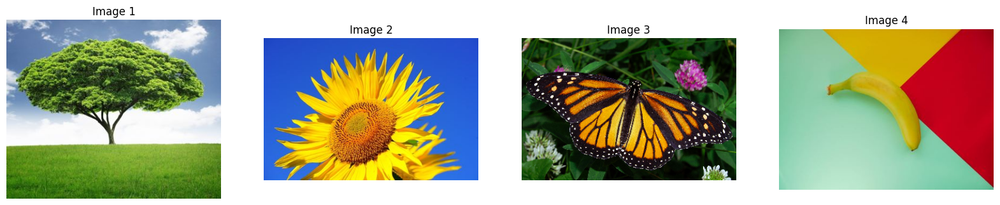

In [60]:
import cv2
import os
import matplotlib.pyplot as plt

image_dir = '/content/Images'

image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

images = [cv2.imread(os.path.join(image_dir, img)) for img in image_files[:8]]

fig, axs = plt.subplots(1, len(images), figsize=(20, 4))

for i in range(len(images)):
    axs[i].imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    axs[i].axis('off')
    axs[i].set_title(f'Image {i+1}')

plt.show()


Starting with a method specific for KNN

In [4]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn import metrics

def segment_image_knn(image, num_clusters_list):
    height, width, channels = image.shape

    image_2d = image.reshape((-1, 3))
    plt.figure(figsize=(15, 5 * len(num_clusters_list)))

    plt.subplot(1, len(num_clusters_list) + 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    silhouette_scores = []
    davies_bouldin_scores = []
    for i, num_clusters in enumerate(num_clusters_list):

        model = KMeans(n_clusters=num_clusters, random_state=0, n_init = 10)
        labels = model.fit_predict(image_2d)

        segmented_image = model.cluster_centers_[labels].reshape((height, width, channels)).astype(np.uint8)

        plt.subplot(1, len(num_clusters_list) + 2, i + 2)
        plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
        plt.title(f'(Clusters: {num_clusters})')

        silhouette_coefficient = metrics.silhouette_score(image_2d, labels)
        db_score = metrics.davies_bouldin_score(image_2d, labels)

        silhouette_scores.append(silhouette_coefficient)
        davies_bouldin_scores.append(db_score)

        print(f"\nMetrics for {num_clusters} Clusters:")
        print(f" - Silhouette Coefficient: {silhouette_coefficient}")
        print(f" - Davies bouldin score: {db_score}")

    plt.tight_layout()
    plt.show()

    return silhouette_scores, davies_bouldin_scores

A method for GMM using the same structure as above.

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn import metrics

def segment_image_gmm(image, num_components_list):
    height, width, channels = image.shape
    image_2d = image.reshape((-1, 3))

    silhouette_scores = []
    davies_bouldin_scores = []

    plt.figure(figsize=(15, 5 * len(num_components_list)))

    plt.subplot(1, len(num_components_list) + 1, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    for i, num_components in enumerate(num_components_list):
        model = GaussianMixture(n_components=num_components, random_state=0)
        labels = model.fit_predict(image_2d)
        means = model.means_.astype(int)
        segmented_image = means[labels].reshape((height, width, channels)).astype(np.uint8)

        plt.subplot(1, len(num_components_list) + 1, i + 2)
        plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
        plt.title(f'(Components: {num_components})')

        silhouette_coefficient = metrics.silhouette_score(image_2d, labels)
        db_score = metrics.davies_bouldin_score(image_2d, labels)

        silhouette_scores.append(silhouette_coefficient)
        davies_bouldin_scores.append(db_score)

        print(f"\nMetrics for GMM: {num_components} Clusters:")
        print(f" - Silhouette Coefficient: {silhouette_coefficient}")
        print(f" - Davies bouldin score: {db_score}")

    plt.tight_layout()
    plt.show()

    return silhouette_scores, davies_bouldin_scores

A method to plot the metrics vs the hyperparameters used, for better visualization.

In [2]:
def plot_clusters_vs_metric(num_components_list, scores, metric_name):
    plt.figure(figsize=(4, 2))
    plt.plot(num_components_list, scores, marker='o', linestyle='-')
    plt.title(f'{metric_name} vs. Number of Clusters')
    plt.xlabel('Number of Clusters')
    plt.ylabel(metric_name)
    plt.grid(True)
    plt.show()

First I am trying on the tree image, with the following clusters structure using KNN.


Metrics for 3 Clusters:
 - Silhouette Coefficient: 0.6043757189524669
 - Davies bouldin score: 0.5882332346031667

Metrics for 4 Clusters:
 - Silhouette Coefficient: 0.600639270446336
 - Davies bouldin score: 0.5351497165587157

Metrics for 5 Clusters:
 - Silhouette Coefficient: 0.5771240865345322
 - Davies bouldin score: 0.5657631306634705

Metrics for 7 Clusters:
 - Silhouette Coefficient: 0.540741729488618
 - Davies bouldin score: 0.6409873764718748


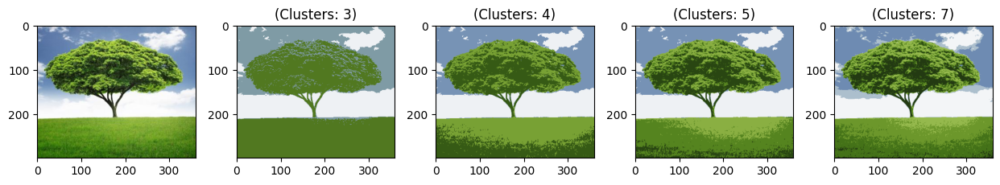

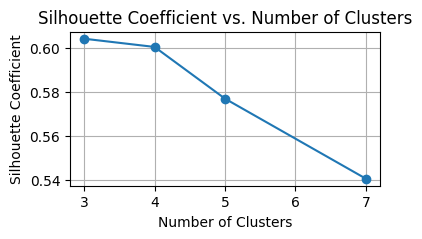

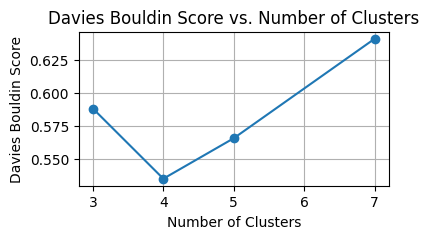

In [ ]:
num_clusters_list = [3, 4, 5, 7]

silhouette_scores, davies_bouldin_scores = segment_image_knn(images[0], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


The silhouette coefficients show a decent cluster separation with 3 and 4 clusters being the best.
The Davies Bouldin scores show also reasonable compactness.
As the number of clusters increases, silhouette coefficients decrease while Davis bouldin increase, which means there are more challenges in maintaining distinct clusters.

The images look rather decent, with a good clustering overall especially when taking 3 and 4 clusters, as the image contains 4 distinct color with some variance and contrast between these colors.


Metrics for GMM: 2 Clusters:
 - Silhouette Coefficient: 0.5636523705105345
 - Davies bouldin score: 0.6910695689552765

Metrics for GMM: 3 Clusters:
 - Silhouette Coefficient: 0.5288236161303287
 - Davies bouldin score: 0.6050589514696398

Metrics for GMM: 4 Clusters:
 - Silhouette Coefficient: 0.3970427541715916
 - Davies bouldin score: 0.7436047409222413

Metrics for GMM: 5 Clusters:
 - Silhouette Coefficient: 0.2929590434209183
 - Davies bouldin score: 1.071629747166939


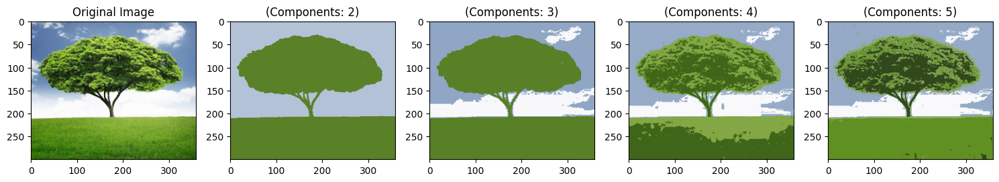

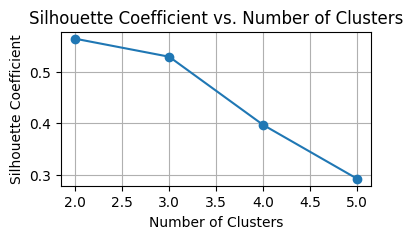

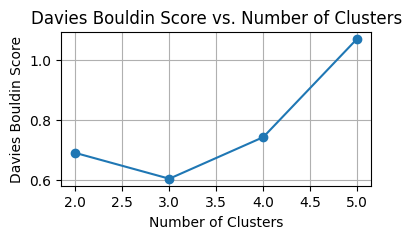

In [ ]:
num_clusters_list = [2, 3, 4, 5]

silhouette_scores_gmm, davies_bouldin_scores_gmm = segment_image_gmm(images[0], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores_gmm, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores_gmm, 'Davies Bouldin Score')


As seen in the images and scores above, GMM struggles to capture the structure of the images, as seen in the decline of silhouette and Davies Bouldin scores, particularly for higher cluster numbers, this is likely due to challenges in modeling the complex distribution of features in the image.

Knn seems to outperform gmm in this case as The varying colors of the tree, grass, and sky are likely better represented by knn's local neighborhood approach. while GMM struggles as it attempts to model the complex data distribution.

Following is the DBSCAN method following the same code structure as GMM and KNN.

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn import metrics

def segment_image_dbscan(image, min_samples_list, epsilon_value):
    height, width, channels = image.shape
    image_2d = image.reshape((height * width, channels))
    silhouette_scores = []
    davies_bouldin_scores = []

    plt.figure(figsize=(15, 5 * len(min_samples_list)))

    plt.subplot(1, len(min_samples_list) + 1, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    for i, min_samples_value in enumerate(min_samples_list):
        model = DBSCAN(eps=epsilon_value, min_samples=min_samples_value)
        labels = model.fit_predict(image_2d)

        segmented_image = labels.reshape((height, width))

        plt.subplot(1, len(min_samples_list) + 1, i + 2)
        plt.imshow(segmented_image, cmap='viridis')
        plt.title(f'(Min Samples: {min_samples_value})')

        silhouette_coefficient = metrics.silhouette_score(image_2d, labels)
        db_score = metrics.davies_bouldin_score(image_2d, labels)

        silhouette_scores.append(silhouette_coefficient)
        davies_bouldin_scores.append(db_score)

        print(f"\nMetrics for DBSCAN: Min Samples {min_samples_value}:")
        print(f" - Silhouette Coefficient: {silhouette_coefficient}")
        print(f" - Davies bouldin score: {db_score}")

    plt.tight_layout()
    plt.show()

    return silhouette_scores, davies_bouldin_scores


Trying this out on the tree image, the DBSCAN ran into alot of problems, specifically the memory kept crashing using it whenever the episolon was a little high or the minimum samples were not high, due to its pairwise distance computations. This limited the ability to try out multiple scenarions, as the scores kept turning not well also. After many tries I noticed that for this image 5 epsilon produces the best Images for visualization, So I tried it with multiple minimum samples as seen below:


Metrics for DBSCAN: Min Samples 50:
 - Silhouette Coefficient: 0.3474001620045484
 - Davies bouldin score: 1.3807948011042963

Metrics for DBSCAN: Min Samples 150:
 - Silhouette Coefficient: 0.28897716139322993
 - Davies bouldin score: 1.679508409647951

Metrics for DBSCAN: Min Samples 200:
 - Silhouette Coefficient: 0.30985728690528147
 - Davies bouldin score: 1.3997178608250236

Metrics for DBSCAN: Min Samples 300:
 - Silhouette Coefficient: 0.2569853045532929
 - Davies bouldin score: 1.430270487465755


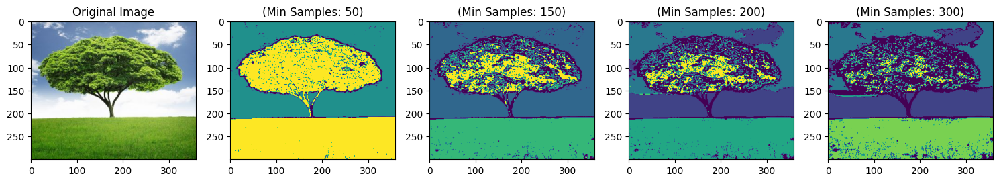

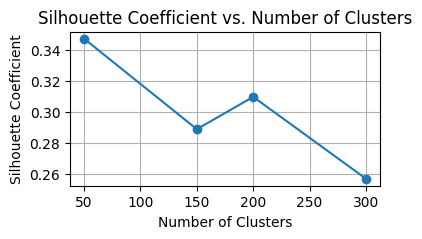

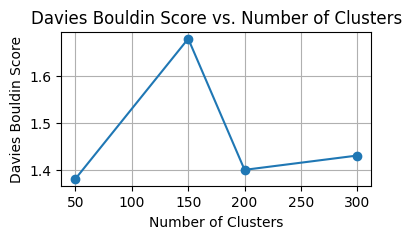

In [ ]:
min_samples_list = [50, 150, 200, 300]
epsilon_value = 5

silhouette_scores_dbscan, davies_bouldin_scores_dbscan = segment_image_dbscan(images[0], min_samples_list, epsilon_value)

plot_clusters_vs_metric(min_samples_list, silhouette_scores_dbscan, 'Silhouette Coefficient')
plot_clusters_vs_metric(min_samples_list, davies_bouldin_scores_dbscan, 'Davies Bouldin Score')

The results for this are really bad, DBSCAN had challenges in finding optimal parameters. The silhouette scores are relatively low, indicating a struggle to form well-defined clusters.

I then wrote the following code to extract the original colors of the image to see it actually brings back the image or not after the not well results. The reason I created a new function and didn't just encapsulate it into the old one is because the old one computes silhouette which takes about 4 minutes for each iteration, so to save time I just encapsulated this into a new function that does not contain the silhouette.

In [5]:
def segment_image_dbscan_colors(image, min_samples_list, epsilon_value):
    height, width, channels = image.shape
    image_2d = image.reshape((height * width, channels))

    plt.figure(figsize=(15, 5 * len(min_samples_list)))

    plt.subplot(1, len(min_samples_list) + 1, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    for i, min_samples_value in enumerate(min_samples_list):
        model = DBSCAN(eps=epsilon_value, min_samples=min_samples_value)
        labels = model.fit_predict(image_2d)

        segmented_image = labels.reshape((height, width))

        colored_segmented_image = np.zeros_like(image, dtype=np.uint8)
        for label in np.unique(labels):
            mask = (segmented_image == label).reshape((height, width, 1))
            color = np.median(image[segmented_image == label], axis=0).astype(np.uint8)
            colored_segmented_image += (mask * color)

        plt.subplot(1, len(min_samples_list) + 1, i + 2)
        plt.imshow(cv2.cvtColor(colored_segmented_image, cv2.COLOR_BGR2RGB))
        plt.title(f'(Min Samples: {min_samples_value})')

    plt.tight_layout()
    plt.show()


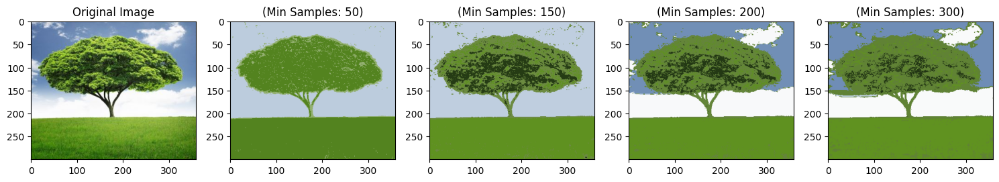

In [47]:
min_samples_list = [50, 150, 200, 300]
epsilon_value = 5

segment_image_dbscan_colors(images[0], min_samples_list, epsilon_value)

We can see that the image is restored in the best way possible especially at samples of 200. I tried other epsilons but including them all would be difficult as it also increases the size of this file big time, so I will only include the best epsilon for all our cases and will change the number of samples.

Now trying on the banana image, which contains 3 colors, but we can say it contains 4 objects as the banana and yellow ground are different objects but same colors, so its highly likely they will be clustered together nonetheless.


Metrics for 2 Clusters:
 - Silhouette Coefficient: 0.7110668290672145
 - Davies bouldin score: 0.5227438251735551

Metrics for 3 Clusters:
 - Silhouette Coefficient: 0.833976346396854
 - Davies bouldin score: 0.24219631596343275

Metrics for 4 Clusters:
 - Silhouette Coefficient: 0.686198626486527
 - Davies bouldin score: 0.4258559054526383

Metrics for 5 Clusters:
 - Silhouette Coefficient: 0.6932838033415811
 - Davies bouldin score: 0.5168038126268186

Metrics for 7 Clusters:
 - Silhouette Coefficient: 0.6664962017919217
 - Davies bouldin score: 0.6466325746132044


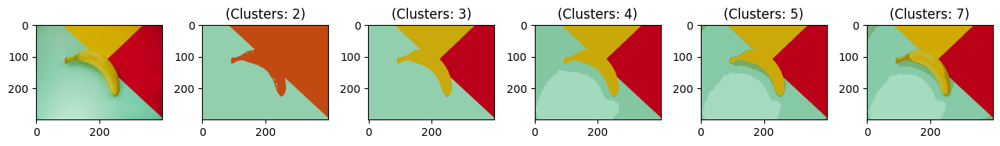

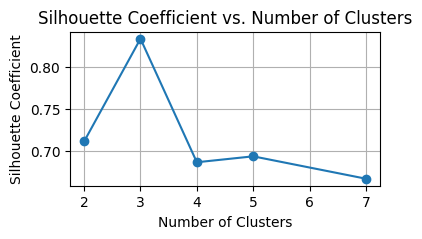

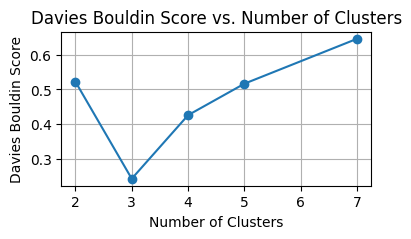

In [8]:
num_clusters_list = [2, 3, 4, 5, 7]

silhouette_scores, davies_bouldin_scores = segment_image_knn(images[3], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


As expected the banana and the yellow ground were clustered together.

As seen here for 2,3 and 5 clusters, the silhouette coefficients are relatively high, which means the clusters are well separated. The Davies Bouldin score when the clusters are at 3 is the lowest also its decent at for 2, 4, and 5 clusters indicating good clustering.

Three clusters might be the optimal choice for this, it also aligns with having three colors (blue, red, and yellow) and a banana (yellow). The more the cluster increases here the silhouette decreases, meaning additional clusters wont contribute that much into the seperation.


Metrics for GMM: 2 Clusters:
 - Silhouette Coefficient: 0.7051954196421505
 - Davies bouldin score: 0.5262377467154785

Metrics for GMM: 3 Clusters:
 - Silhouette Coefficient: 0.7615802826618888
 - Davies bouldin score: 0.4247901673671621

Metrics for GMM: 4 Clusters:
 - Silhouette Coefficient: 0.5551548153032392
 - Davies bouldin score: 0.5970070663406093

Metrics for GMM: 5 Clusters:
 - Silhouette Coefficient: 0.6028031111910623
 - Davies bouldin score: 0.8713064831900688

Metrics for GMM: 7 Clusters:
 - Silhouette Coefficient: 0.46547089704572325
 - Davies bouldin score: 1.0838837045429612


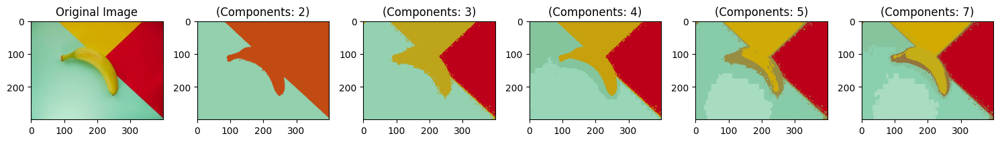

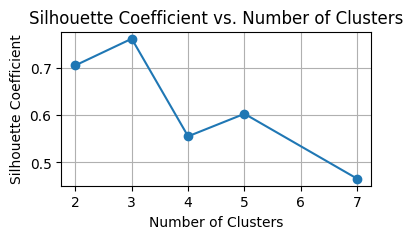

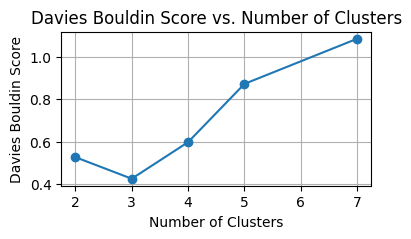

In [9]:
num_clusters_list = [2, 3, 4, 5, 7]

silhouette_scores_gmm, davies_bouldin_scores_gmm = segment_image_gmm(images[3], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores_gmm, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores_gmm, 'Davies Bouldin Score')


Both KNN and GMM produce decent results, both of them also suggest that 3 clusters is the best in this case.
KNN generally has a slightly higher silhouette coefficient for 3 clusters.
KNN may be preferred for this due to its local neighborhood-based approach and simplicity in capturing color clusters in the image.


Metrics for DBSCAN: Min Samples 10:
 - Silhouette Coefficient: 0.07566012425322115
 - Davies bouldin score: 1.2926968251985795

Metrics for DBSCAN: Min Samples 20:
 - Silhouette Coefficient: 0.4967749622729714
 - Davies bouldin score: 0.8411276353103204

Metrics for DBSCAN: Min Samples 50:
 - Silhouette Coefficient: 0.7716550301413394
 - Davies bouldin score: 0.9161227481463855

Metrics for DBSCAN: Min Samples 150:
 - Silhouette Coefficient: 0.7500552880248557
 - Davies bouldin score: 0.8566648046636487

Metrics for DBSCAN: Min Samples 200:
 - Silhouette Coefficient: 0.687744709795625
 - Davies bouldin score: 1.1185400487062236


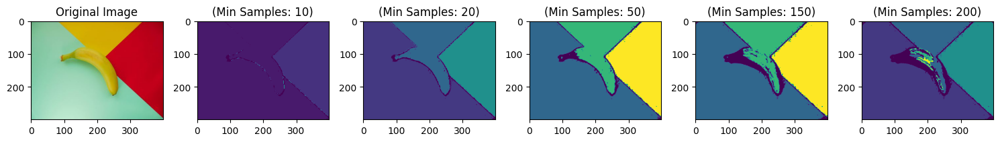

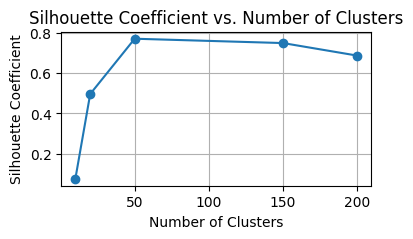

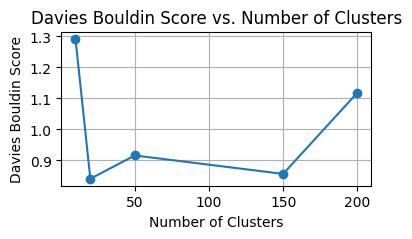

In [14]:
min_samples_list = [10, 20, 50, 150, 200]
epsilon_value = 5

silhouette_scores_dbscan, davies_bouldin_scores_dbscan = segment_image_dbscan(images[3], min_samples_list, epsilon_value)

plot_clusters_vs_metric(min_samples_list, silhouette_scores_dbscan, 'Silhouette Coefficient')
plot_clusters_vs_metric(min_samples_list, davies_bouldin_scores_dbscan, 'Davies Bouldin Score')

The DBSCAN results for this image show a sensitivity to the choice of the minimum number of samples (min_samples). The silhouette coefficients increase with higher min_samples, which means better cluster separation, especially min_samples between 20 and 150. However, as min_samples becomes too high (200), the silhouette coefficient and Davies Bouldin score become worse, possibly causing over smoothing and merging of clusters.

Now checking if the restored images are correct using the original colors.

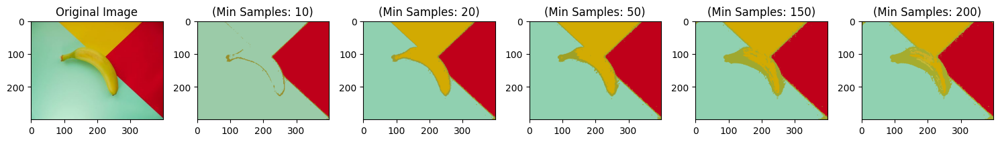

In [51]:
min_samples_list = [10, 20, 50, 150, 200]
epsilon_value = 5

segment_image_dbscan_colors(images[3], min_samples_list, epsilon_value)

After visualizing the images we can see the image restored especially at 20 samples, even though the scores are not best at 20, but images prove otherwise.

KNN showed the best results for this image as well between the 3 methods, also DBSCAN showed promising results for this compared to the tree picture above.


Metrics for 3 Clusters:
 - Silhouette Coefficient: 0.6860844347278118
 - Davies bouldin score: 0.7975885859956925

Metrics for 5 Clusters:
 - Silhouette Coefficient: 0.4782161631459318
 - Davies bouldin score: 0.8700846600023026

Metrics for 6 Clusters:
 - Silhouette Coefficient: 0.4881292228202867
 - Davies bouldin score: 0.8151201042449241

Metrics for 8 Clusters:
 - Silhouette Coefficient: 0.44668890532499145
 - Davies bouldin score: 0.8091065048124855


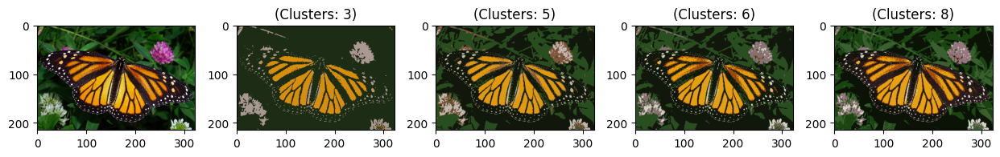

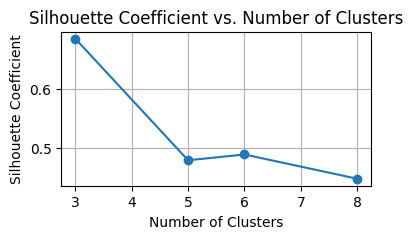

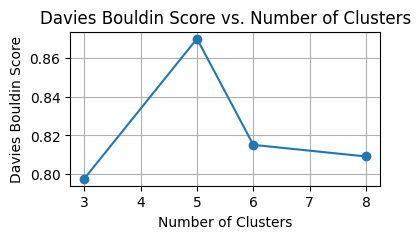

In [ ]:
num_clusters_list = [3, 5, 6, 8]

silhouette_scores, davies_bouldin_scores = segment_image_knn(images[2], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


As seen above the scores keep getting worse as the clusters increase, even though visually using 6 clusters is the better approach for the butterfly image, but as the image do not have many colors we see that 3 clusters produce the best results.


Metrics for GMM: 3 Clusters:
 - Silhouette Coefficient: 0.5387064459910047
 - Davies bouldin score: 1.1104202390210953

Metrics for GMM: 5 Clusters:
 - Silhouette Coefficient: 0.22716980216400418
 - Davies bouldin score: 1.2983421291300703

Metrics for GMM: 6 Clusters:
 - Silhouette Coefficient: 0.3215829692610692
 - Davies bouldin score: 1.1955401884470491

Metrics for GMM: 8 Clusters:
 - Silhouette Coefficient: 0.3291600671399489
 - Davies bouldin score: 1.1319944948795642


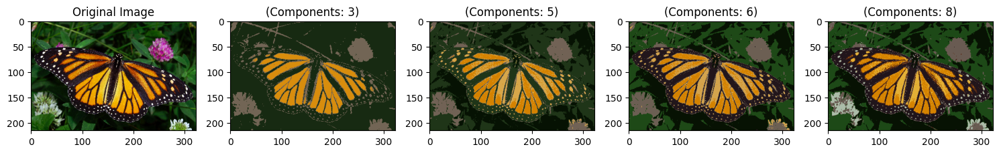

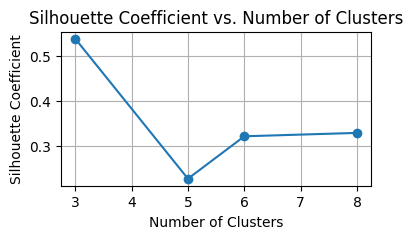

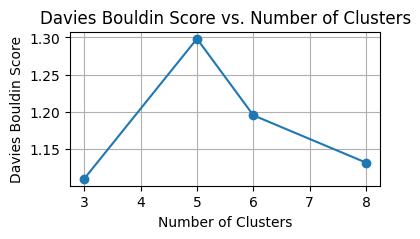

In [ ]:
num_clusters_list = [3, 5, 6, 8]

silhouette_scores_gmm, davies_bouldin_scores_gmm = segment_image_gmm(images[2], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores_gmm, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores_gmm, 'Davies Bouldin Score')


Same as KNN 3 clusters produce the best results, KNN demonstrates better clustering performance compared to GMM. The silhouette coefficients for knn are consistently higher across different cluster numbers, suggesting more distinct and well-separated clusters. In contrast, GMM exhibits lower silhouette coefficients, indicating challenges in capturing the underlying structure of the image.

For this I will try multiple epsilion values before applying the full function

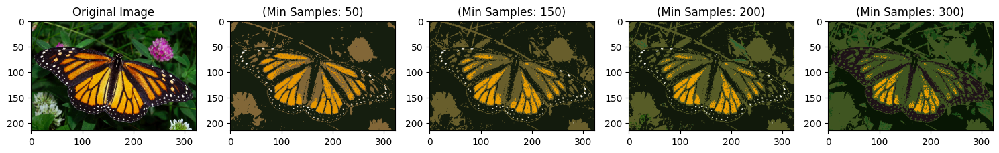

In [74]:
min_samples_list = [50, 150, 200, 300]
epsilon_value = 5
segment_image_dbscan_colors(images[2], min_samples_list, epsilon_value)

Now trying this out to calculate its scores.


Metrics for DBSCAN: Min Samples 50:
 - Silhouette Coefficient: 0.15446426031303945
 - Davies bouldin score: 1.0217151689920325

Metrics for DBSCAN: Min Samples 150:
 - Silhouette Coefficient: 0.4009163362914194
 - Davies bouldin score: 0.8100934334335121

Metrics for DBSCAN: Min Samples 200:
 - Silhouette Coefficient: 0.009323125929750837
 - Davies bouldin score: 1.036957589277917

Metrics for DBSCAN: Min Samples 300:
 - Silhouette Coefficient: -0.01677989219846486
 - Davies bouldin score: 1.1742312674609072


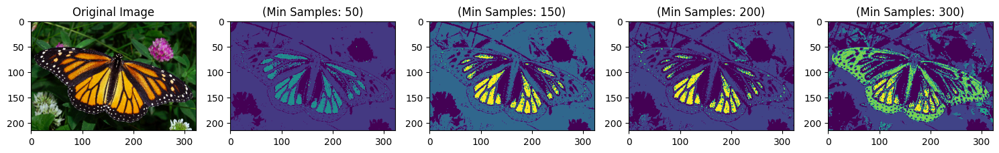

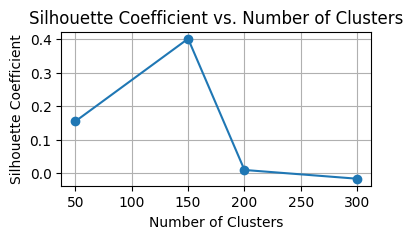

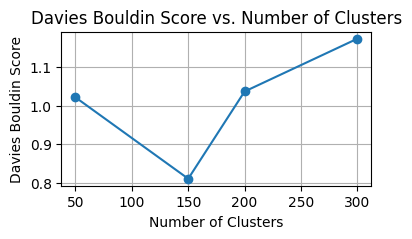

In [61]:
min_samples_list = [50, 150, 200, 300]
epsilon_value = 5

silhouette_scores_dbscan, davies_bouldin_scores_dbscan = segment_image_dbscan(images[2], min_samples_list, epsilon_value)

plot_clusters_vs_metric(min_samples_list, silhouette_scores_dbscan, 'Silhouette Coefficient')
plot_clusters_vs_metric(min_samples_list, davies_bouldin_scores_dbscan, 'Davies Bouldin Score')

Final image I'm testing is the sunflower image, it has two colors in general, so two clusters are expected to produce the best values especially in terms of compactness (Davies Bouldion score).


Metrics for 2 Clusters:
 - Silhouette Coefficient: 0.7872582795635213
 - Davies bouldin score: 0.30459836181674105

Metrics for 3 Clusters:
 - Silhouette Coefficient: 0.7116795759072766
 - Davies bouldin score: 0.6219100163992591

Metrics for 5 Clusters:
 - Silhouette Coefficient: 0.6615495673569665
 - Davies bouldin score: 0.7088098088398929

Metrics for 6 Clusters:
 - Silhouette Coefficient: 0.6379569575831908
 - Davies bouldin score: 0.7668040700386319


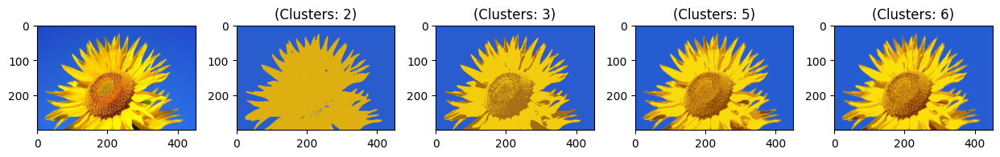

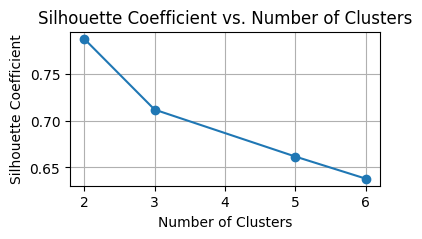

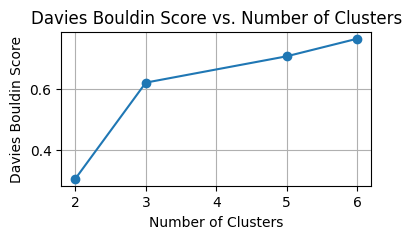

In [ ]:
num_clusters_list = [2, 3, 5, 6]

silhouette_scores, davies_bouldin_scores = segment_image_knn(images[1], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


As expected two clusters produce the best results, 3 clusters also produce decent results, the images look good as well.


Metrics for GMM: 2 Clusters:
 - Silhouette Coefficient: 0.6732167295476545
 - Davies bouldin score: 0.40306665404887015

Metrics for GMM: 3 Clusters:
 - Silhouette Coefficient: 0.5187442669493021
 - Davies bouldin score: 0.822568983661915

Metrics for GMM: 5 Clusters:
 - Silhouette Coefficient: 0.2693636639484358
 - Davies bouldin score: 2.3249354097436017

Metrics for GMM: 6 Clusters:
 - Silhouette Coefficient: 0.16793341640740117
 - Davies bouldin score: 2.0272673846954716


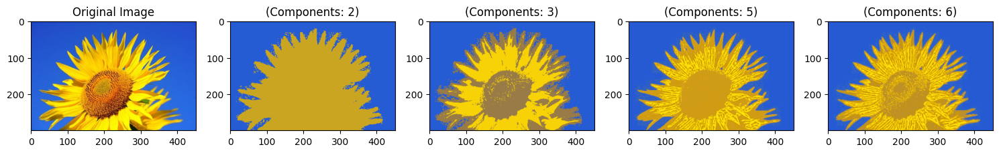

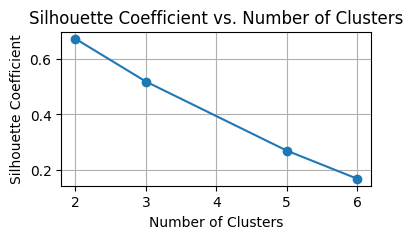

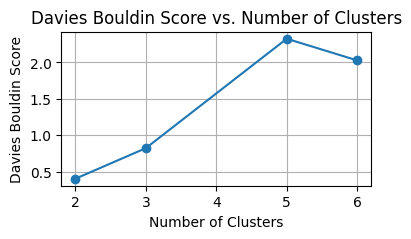

In [ ]:
num_clusters_list = [2, 3, 5, 6]

silhouette_scores_gmm, davies_bouldin_scores_gmm = segment_image_gmm(images[1], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores_gmm, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores_gmm, 'Davies Bouldin Score')


Same as the other cases above, GMM still produces worse results than KNN but with the same score variance, the more the clusters the more the silhouette decreases and davies bouldin increases.


Metrics for DBSCAN: Min Samples 50:
 - Silhouette Coefficient: 0.2862324344902155
 - Davies bouldin score: 1.4765263898125591

Metrics for DBSCAN: Min Samples 150:
 - Silhouette Coefficient: 0.4624550425057889
 - Davies bouldin score: 1.198019559032503

Metrics for DBSCAN: Min Samples 200:
 - Silhouette Coefficient: 0.5378205139740723
 - Davies bouldin score: 0.8856302697897297

Metrics for DBSCAN: Min Samples 300:
 - Silhouette Coefficient: 0.5254187391585002
 - Davies bouldin score: 0.7781779858303771


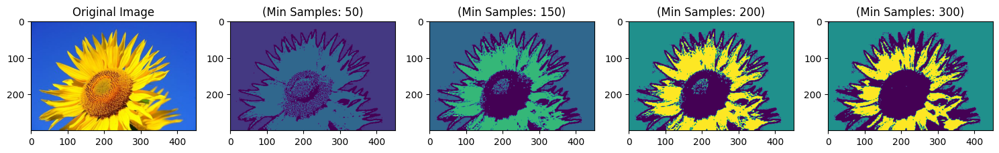

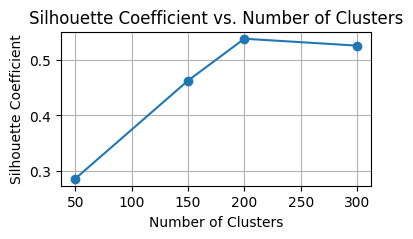

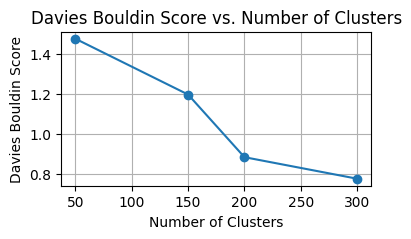

In [ ]:
min_samples_list = [50, 150, 200, 300]
epsilon_value = 5

silhouette_scores_dbscan, davies_bouldin_scores_dbscan = segment_image_dbscan(images[1], min_samples_list, epsilon_value)

plot_clusters_vs_metric(min_samples_list, silhouette_scores_dbscan, 'Silhouette Coefficient')
plot_clusters_vs_metric(min_samples_list, davies_bouldin_scores_dbscan, 'Davies Bouldin Score')

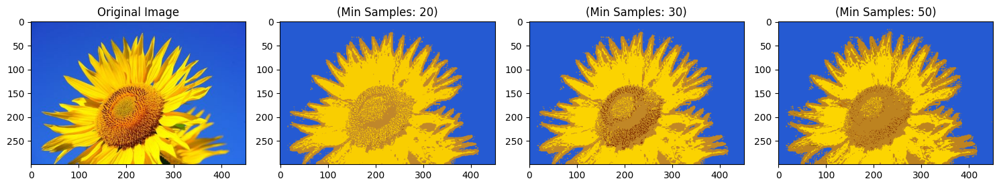

In [61]:
min_samples_list = [20, 30, 50]
epsilon_value = 3

segment_image_dbscan_colors(images[1], min_samples_list, epsilon_value)

**Augment the RGB channels with two additional features that correspond to the x-y coordinates of the pixel.**

First with a function that takes the image and stacks the x-y coordinates features with the image features, I also normalized the x-y features by dividing them using width and height, the results would be drastic without this normalization.

In [18]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn import metrics

def augment_with_xy(image):
    height, width, _ = image.shape

    x, y = np.meshgrid(np.arange(width), np.arange(height))

    x_normalized = x / width
    y_normalized = y / height

    augmented_image = np.dstack((image, x_normalized, y_normalized))

    return augmented_image

In [8]:
def segment_image_knn_xy(image, num_clusters_list):
    height, width, channels = image.shape

    augmented_image = augment_with_xy(image)

    image_2d = augmented_image.reshape((-1, channels + 2))

    plt.figure(figsize=(15, 5 * len(num_clusters_list)))

    plt.subplot(1, len(num_clusters_list) + 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    silhouette_scores = []
    davies_bouldin_scores = []

    for i, num_clusters in enumerate(num_clusters_list):
        model = KMeans(n_clusters=num_clusters, random_state=0, n_init=10)
        labels = model.fit_predict(image_2d)

        segmented_image = labels.reshape((height, width)).astype(np.uint8)

        plt.subplot(1, len(num_clusters_list) + 2, i + 2)
        plt.imshow(segmented_image, cmap='viridis')
        plt.title(f'(Clusters: {num_clusters})')

        silhouette_coefficient = metrics.silhouette_score(image_2d, labels)
        db_score = metrics.davies_bouldin_score(image_2d, labels)

        silhouette_scores.append(silhouette_coefficient)
        davies_bouldin_scores.append(db_score)

        print(f"\nMetrics for {num_clusters} Clusters:")
        print(f" - Silhouette Coefficient: {silhouette_coefficient}")
        print(f" - Davies bouldin score: {db_score}")

    plt.tight_layout()
    plt.show()

    return silhouette_scores, davies_bouldin_scores


Metrics for 2 Clusters:
 - Silhouette Coefficient: 0.7110434005194671
 - Davies bouldin score: 0.5227625506669327

Metrics for 3 Clusters:
 - Silhouette Coefficient: 0.8339337832116847
 - Davies bouldin score: 0.24222761506358426

Metrics for 4 Clusters:
 - Silhouette Coefficient: 0.6862614371922994
 - Davies bouldin score: 0.42529566028976734

Metrics for 5 Clusters:
 - Silhouette Coefficient: 0.6932442611848616
 - Davies bouldin score: 0.5172510694381558

Metrics for 7 Clusters:
 - Silhouette Coefficient: 0.6667148694047512
 - Davies bouldin score: 0.6454427983979967


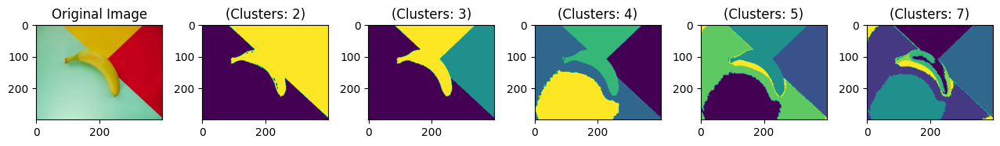

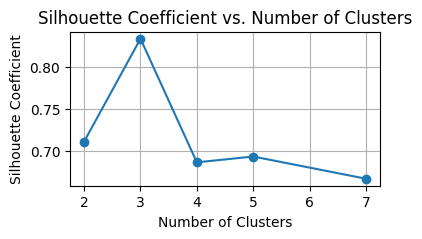

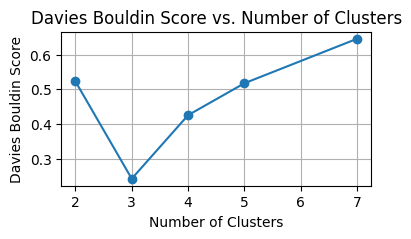

In [16]:
num_clusters_list = [2, 3, 4, 5, 7]

silhouette_scores, davies_bouldin_scores = segment_image_knn_xy(images[3], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


The addition of x-y coordinates did not significantly impact the performance of knn and clustering, this might be due the fact that the color information itself is sufficient for the knn so the extra the spatial coordinates did not affect the performance that much, also the objects in the image are evenly distributed spatially and do not exhibit distinct spatial patterns.

Now experimenting with GMM and augmenting the image beforehand:

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn import metrics

def segment_image_gmm_xy(image, num_components_list):
    height, width, channels = image.shape

    augmented_image = augment_with_xy(image)

    image_2d = augmented_image.reshape((-1, channels + 2))

    silhouette_scores = []
    davies_bouldin_scores = []

    plt.figure(figsize=(15, 5 * len(num_components_list)))

    plt.subplot(1, len(num_components_list) + 1, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    for i, num_components in enumerate(num_components_list):
        model = GaussianMixture(n_components=num_components, random_state=0)
        labels = model.fit_predict(image_2d)
        means = model.means_[:, :3].astype(int)
        segmented_image = means[labels].reshape((height, width, channels)).astype(np.uint8)

        plt.subplot(1, len(num_components_list) + 1, i + 2)
        plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
        plt.title(f'(Components: {num_components})')

        silhouette_coefficient = metrics.silhouette_score(image_2d, labels)
        db_score = metrics.davies_bouldin_score(image_2d, labels)

        silhouette_scores.append(silhouette_coefficient)
        davies_bouldin_scores.append(db_score)

        print(f"\nMetrics for GMM: {num_components} Clusters:")
        print(f" - Silhouette Coefficient: {silhouette_coefficient}")
        print(f" - Davies bouldin score: {db_score}")

    plt.tight_layout()
    plt.show()

    return silhouette_scores, davies_bouldin_scores



Metrics for GMM: 2 Clusters:
 - Silhouette Coefficient: 0.6650612035797567
 - Davies bouldin score: 0.560056829630736

Metrics for GMM: 3 Clusters:
 - Silhouette Coefficient: 0.7355828180789152
 - Davies bouldin score: 0.4751884423576625

Metrics for GMM: 4 Clusters:
 - Silhouette Coefficient: 0.5141498686381648
 - Davies bouldin score: 0.6703920605815408

Metrics for GMM: 5 Clusters:
 - Silhouette Coefficient: 0.4609744317022689
 - Davies bouldin score: 0.8888860024652463

Metrics for GMM: 7 Clusters:
 - Silhouette Coefficient: 0.38087216409982794
 - Davies bouldin score: 1.2668236313196253


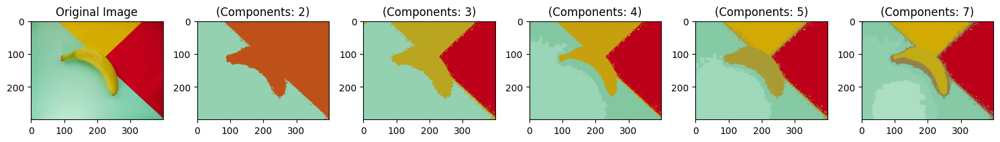

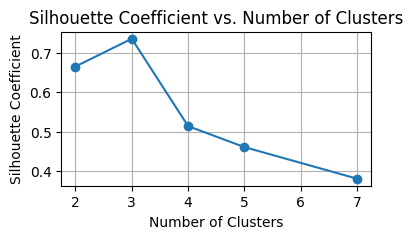

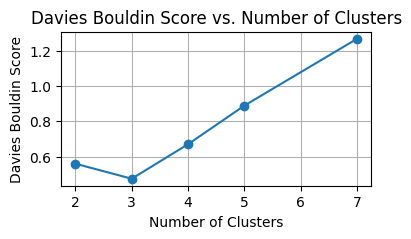

In [38]:
num_clusters_list = [2, 3, 4, 5, 7]

silhouette_scores, davies_bouldin_scores = segment_image_gmm_xy(images[3], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


 The results for the GMM with augmentation are not as good as before, this shows that the added x-y coordinates did not provide substantial information for GMM in improving cluster separation. The GMM, being a probabilistic model, might not have benefitted significantly from the spatial coordinates, especially when compared to the color information. If we look at the images as well, between with and without we can notice there an extra few noise which the gmm exhibits.

The DBSCAN code including image augmentation

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn import metrics

def segment_image_dbscan_xy(image, min_samples_list, epsilon_value):
    height, width, channels = image.shape

    augmented_image = augment_with_xy(image)

    image_2d = augmented_image.reshape((-1, channels + 2))

    silhouette_scores = []
    davies_bouldin_scores = []

    plt.figure(figsize=(15, 5 * len(min_samples_list)))

    plt.subplot(1, len(min_samples_list) + 1, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    for i, min_samples_value in enumerate(min_samples_list):
        model = DBSCAN(eps=epsilon_value, min_samples=min_samples_value)
        labels = model.fit_predict(image_2d)

        segmented_image = labels.reshape((height, width))

        plt.subplot(1, len(min_samples_list) + 1, i + 2)
        plt.imshow(segmented_image, cmap='viridis')
        plt.title(f'(Min Samples: {min_samples_value})')

        silhouette_coefficient = metrics.silhouette_score(image_2d, labels)
        db_score = metrics.davies_bouldin_score(image_2d, labels)

        silhouette_scores.append(silhouette_coefficient)
        davies_bouldin_scores.append(db_score)

        print(f"\nMetrics for DBSCAN: Min Samples {min_samples_value}:")
        print(f" - Silhouette Coefficient: {silhouette_coefficient}")
        print(f" - Davies bouldin score: {db_score}")

    plt.tight_layout()
    plt.show()

    return silhouette_scores, davies_bouldin_scores


Also the code that retireves the original colors of the image:

In [25]:
def segment_image_dbscan_colors_xy(image, min_samples_list, epsilon_value):
    height, width, channels = image.shape
    augmented_image = augment_with_xy(image)

    image_2d = augmented_image.reshape((-1, channels + 2))

    plt.figure(figsize=(15, 5 * len(min_samples_list)))

    plt.subplot(1, len(min_samples_list) + 1, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    for i, min_samples_value in enumerate(min_samples_list):
        model = DBSCAN(eps=epsilon_value, min_samples=min_samples_value)
        labels = model.fit_predict(image_2d)

        segmented_image = labels.reshape((height, width))

        colored_segmented_image = np.zeros_like(image, dtype=np.uint8)
        for label in np.unique(labels):
            mask = (segmented_image == label).reshape((height, width, 1))
            color = np.median(image[segmented_image == label], axis=0).astype(np.uint8)
            colored_segmented_image += (mask * color)

        plt.subplot(1, len(min_samples_list) + 1, i + 2)
        plt.imshow(cv2.cvtColor(colored_segmented_image, cv2.COLOR_BGR2RGB))
        plt.title(f'(Min Samples: {min_samples_value})')

    plt.tight_layout()
    plt.show()



Metrics for DBSCAN: Min Samples 10:
 - Silhouette Coefficient: 0.510560897217805
 - Davies bouldin score: 1.171583665133825

Metrics for DBSCAN: Min Samples 20:
 - Silhouette Coefficient: 0.4936657366711215
 - Davies bouldin score: 0.8426240821520995

Metrics for DBSCAN: Min Samples 50:
 - Silhouette Coefficient: 0.7707292628922034
 - Davies bouldin score: 0.9166134898151876

Metrics for DBSCAN: Min Samples 150:
 - Silhouette Coefficient: 0.7472259643637099
 - Davies bouldin score: 0.8611151466097146

Metrics for DBSCAN: Min Samples 200:
 - Silhouette Coefficient: 0.6844172852570516
 - Davies bouldin score: 1.1323114822581317


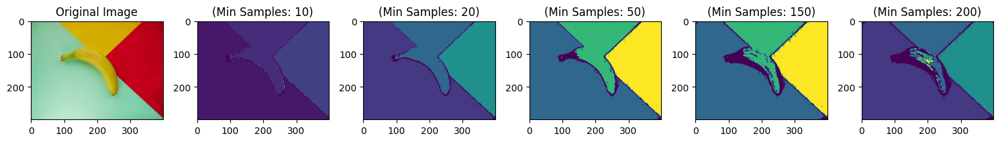

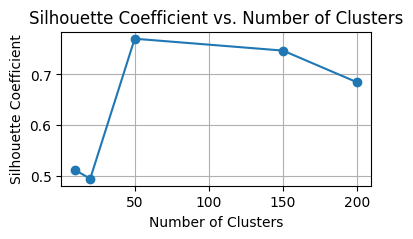

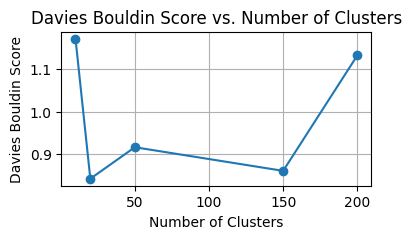

In [40]:
min_samples_list = [10, 20, 50, 150, 200]
epsilon_value = 5

silhouette_scores_dbscan, davies_bouldin_scores_dbscan = segment_image_dbscan_xy(images[3], min_samples_list, epsilon_value)

plot_clusters_vs_metric(min_samples_list, silhouette_scores_dbscan, 'Silhouette Coefficient')
plot_clusters_vs_metric(min_samples_list, davies_bouldin_scores_dbscan, 'Davies Bouldin Score')

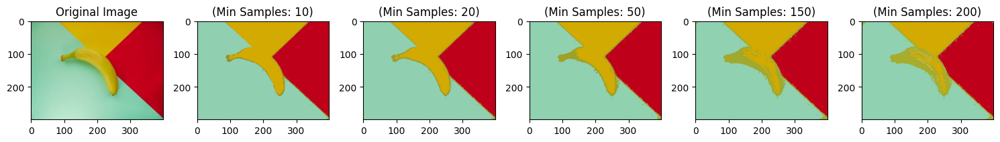

In [26]:
min_samples_list = [10, 20, 50, 150, 200]
epsilon_value = 5

segment_image_dbscan_colors_xy(images[3], min_samples_list, epsilon_value)

Looking at the results in this part, it produces much better results that the original, at 10 samples we can see the image restored compared to without the extra features, without x-y 20 samples were needed for the image to be restored, this is because DBSCAN benefits from the spatial information provided by XY coordinates as it leverages density-based clustering,


Metrics for 3 Clusters:
 - Silhouette Coefficient: 0.6035375096449518
 - Davies bouldin score: 0.5915037119938477

Metrics for 4 Clusters:
 - Silhouette Coefficient: 0.6005773126085304
 - Davies bouldin score: 0.5352357384713501

Metrics for 5 Clusters:
 - Silhouette Coefficient: 0.5778324238341236
 - Davies bouldin score: 0.5643076565526347

Metrics for 7 Clusters:
 - Silhouette Coefficient: 0.5406912258482472
 - Davies bouldin score: 0.6400306286219809


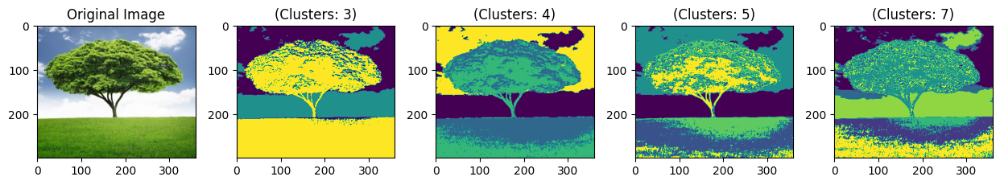

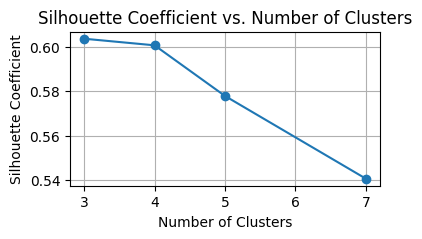

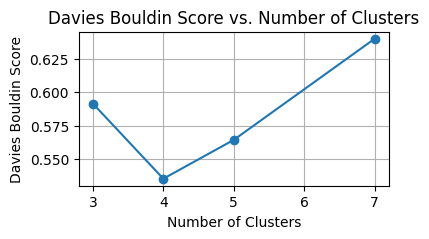

In [41]:
num_clusters_list = [3, 4, 5, 7]

silhouette_scores, davies_bouldin_scores = segment_image_knn_xy(images[0], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


Same for the case above, the stacking of x-y coordinates did not have a major effect on the KNN, this is because kNN is an algorithm that uses distance metric techniques to identify the similarities and dissimilarities between the data points and x-y features may introduce spatial information that do not impact the nearest neighbor relationships.


Metrics for GMM: 3 Clusters:
 - Silhouette Coefficient: 0.48420865085980497
 - Davies bouldin score: 0.645253823725934

Metrics for GMM: 4 Clusters:
 - Silhouette Coefficient: 0.2010498439216076
 - Davies bouldin score: 2.175154362971371

Metrics for GMM: 5 Clusters:
 - Silhouette Coefficient: 0.38323251050574064
 - Davies bouldin score: 0.9198263289915

Metrics for GMM: 7 Clusters:
 - Silhouette Coefficient: 0.22216311487478568
 - Davies bouldin score: 1.336891428489247


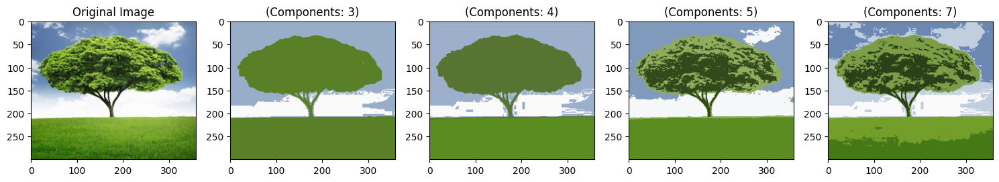

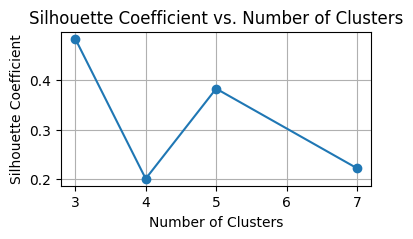

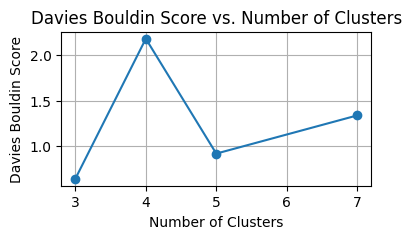

In [42]:
num_clusters_list = [3, 4, 5, 7]

silhouette_scores, davies_bouldin_scores = segment_image_gmm_xy(images[0], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


The augmentation of x-y features in GMM clustering led to a decrease in silhouette and an increase in Davies Bouldin compared to the non-augmented approach. This means that the augmentation might introduce noise or distortions that negatively impact the GMM ability to capture the structure of the data, resulting in poorer clustering performance.


Metrics for DBSCAN: Min Samples 50:
 - Silhouette Coefficient: 0.3481111454692198
 - Davies bouldin score: 1.379554972920576

Metrics for DBSCAN: Min Samples 150:
 - Silhouette Coefficient: 0.28326268131706267
 - Davies bouldin score: 1.7034874596587801

Metrics for DBSCAN: Min Samples 200:
 - Silhouette Coefficient: 0.3766114788194955
 - Davies bouldin score: 1.568248144770923

Metrics for DBSCAN: Min Samples 300:
 - Silhouette Coefficient: 0.24443580278314775
 - Davies bouldin score: 1.440825278806576


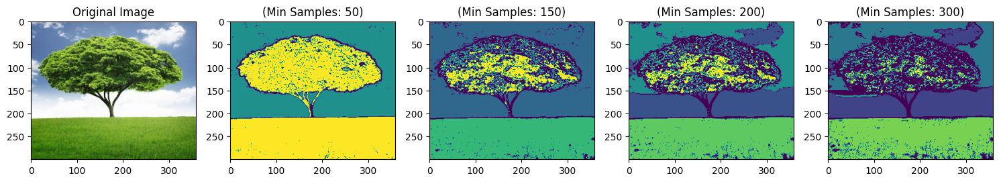

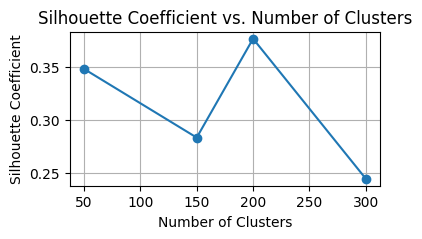

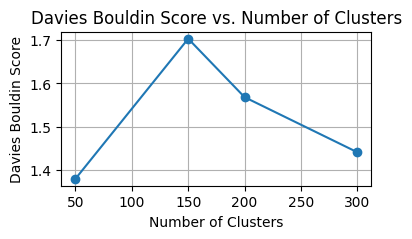

In [43]:
min_samples_list = [50, 150, 200, 300]
epsilon_value = 5

silhouette_scores_dbscan, davies_bouldin_scores_dbscan = segment_image_dbscan_xy(images[0], min_samples_list, epsilon_value)

plot_clusters_vs_metric(min_samples_list, silhouette_scores_dbscan, 'Silhouette Coefficient')
plot_clusters_vs_metric(min_samples_list, davies_bouldin_scores_dbscan, 'Davies Bouldin Score')

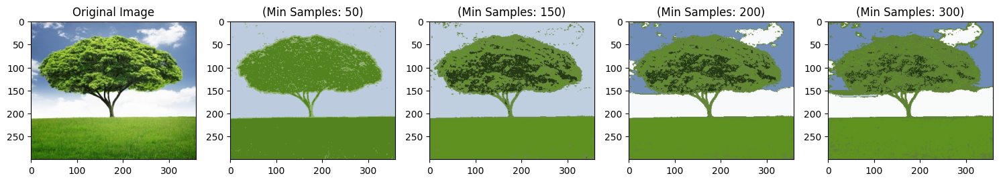

In [27]:
min_samples_list = [50, 150, 200, 300]
epsilon_value = 5

segment_image_dbscan_colors_xy(images[0], min_samples_list, epsilon_value)

DBSCAN didnt have much effect on this image as the previous one, almost the same results, this might be because image lacks distinct density variations.


Metrics for 3 Clusters:
 - Silhouette Coefficient: 0.6860612616299182
 - Davies bouldin score: 0.7976059232463814

Metrics for 4 Clusters:
 - Silhouette Coefficient: 0.48501398752397856
 - Davies bouldin score: 0.8472613356490051

Metrics for 5 Clusters:
 - Silhouette Coefficient: 0.4781848089538916
 - Davies bouldin score: 0.8702860335876107

Metrics for 6 Clusters:
 - Silhouette Coefficient: 0.4876070074859456
 - Davies bouldin score: 0.816247147606993

Metrics for 8 Clusters:
 - Silhouette Coefficient: 0.4463571216284568
 - Davies bouldin score: 0.8096270355203902


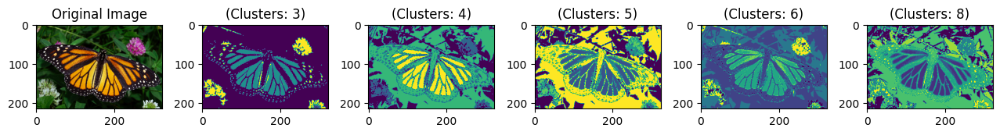

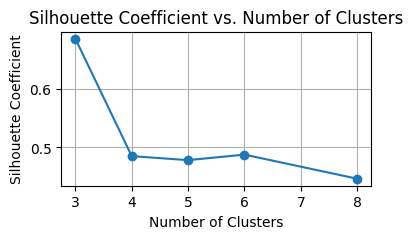

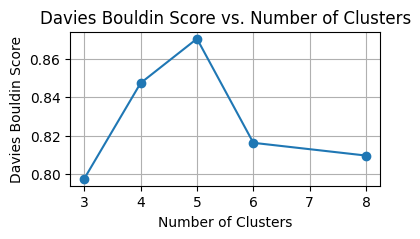

In [66]:
num_clusters_list = [3, 4, 5, 6, 8]

silhouette_scores, davies_bouldin_scores = segment_image_knn_xy(images[2], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


Exactly the same as the cases above, KNN was not heavily affected by the addition of the x-y features.


Metrics for GMM: 3 Clusters:
 - Silhouette Coefficient: 0.5125250771042753
 - Davies bouldin score: 1.131692756869321

Metrics for GMM: 4 Clusters:
 - Silhouette Coefficient: 0.23042799674071748
 - Davies bouldin score: 1.1494958997640135

Metrics for GMM: 5 Clusters:
 - Silhouette Coefficient: 0.3241939329012768
 - Davies bouldin score: 1.5194560325966902

Metrics for GMM: 6 Clusters:
 - Silhouette Coefficient: 0.3601239092905719
 - Davies bouldin score: 1.133116464352704

Metrics for GMM: 8 Clusters:
 - Silhouette Coefficient: 0.32237369892515727
 - Davies bouldin score: 1.3946075706384011


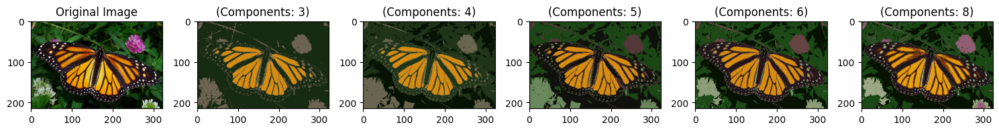

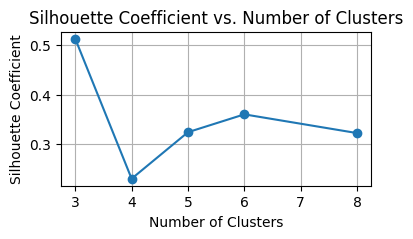

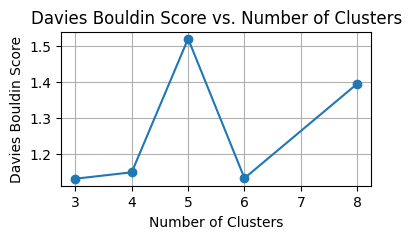

In [67]:
num_clusters_list = [3, 4, 5, 6, 8]

silhouette_scores, davies_bouldin_scores = segment_image_gmm_xy(images[2], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


The augmentation resulted in a mixed impact on clustering performance in this case. While the Silhouette for some cluster numbers decreased, the Davies-Bouldin scores showed variations. This suggests that the augmentation may have introduced complexities affecting the GMM.


Metrics for DBSCAN: Min Samples 30:
 - Silhouette Coefficient: 0.11817574397168994
 - Davies bouldin score: 0.8615578882448723

Metrics for DBSCAN: Min Samples 50:
 - Silhouette Coefficient: 0.31116180411447386
 - Davies bouldin score: 0.9853393030554107

Metrics for DBSCAN: Min Samples 100:
 - Silhouette Coefficient: 0.43410843354538065
 - Davies bouldin score: 0.8092424982259561

Metrics for DBSCAN: Min Samples 150:
 - Silhouette Coefficient: 0.34857187064892087
 - Davies bouldin score: 0.8220943708417678

Metrics for DBSCAN: Min Samples 200:
 - Silhouette Coefficient: 0.12628103752614245
 - Davies bouldin score: 1.03728941501995

Metrics for DBSCAN: Min Samples 300:
 - Silhouette Coefficient: -0.04608247062126458
 - Davies bouldin score: 1.1858890265117885


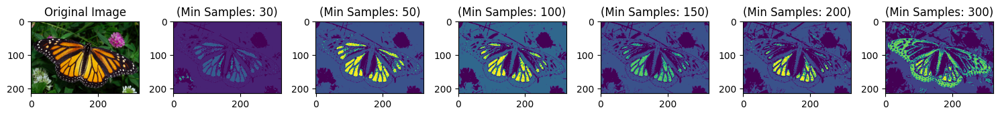

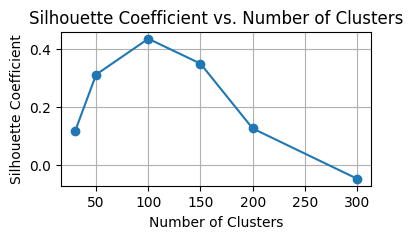

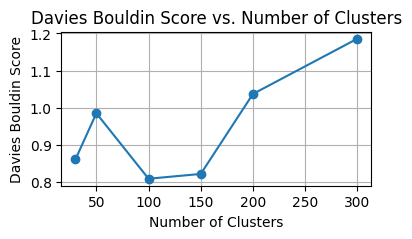

In [73]:
min_samples_list = [30, 50, 100, 150, 200, 300]
epsilon_value = 5

silhouette_scores_dbscan, davies_bouldin_scores_dbscan = segment_image_dbscan_xy(images[2], min_samples_list, epsilon_value)

plot_clusters_vs_metric(min_samples_list, silhouette_scores_dbscan, 'Silhouette Coefficient')
plot_clusters_vs_metric(min_samples_list, davies_bouldin_scores_dbscan, 'Davies Bouldin Score')

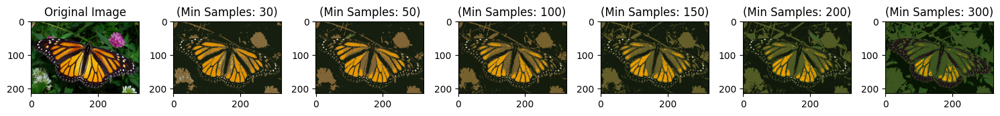

In [28]:
min_samples_list = [30, 50, 100, 150, 200, 300]
epsilon_value = 5

segment_image_dbscan_colors_xy(images[2], min_samples_list, epsilon_value)

The results for DBSCAN using x-y coordinates are far better than without, this is becuase it benefits from the spatial information provided by XY coordinates as it leverages density-based clustering.


Metrics for 2 Clusters:
 - Silhouette Coefficient: 0.7872299438347548
 - Davies bouldin score: 0.3046276089979111

Metrics for 3 Clusters:
 - Silhouette Coefficient: 0.7116698669401329
 - Davies bouldin score: 0.6218554471283754

Metrics for 5 Clusters:
 - Silhouette Coefficient: 0.6608667788363651
 - Davies bouldin score: 0.7085813566793714

Metrics for 6 Clusters:
 - Silhouette Coefficient: 0.6377126309124612
 - Davies bouldin score: 0.7671832406041433


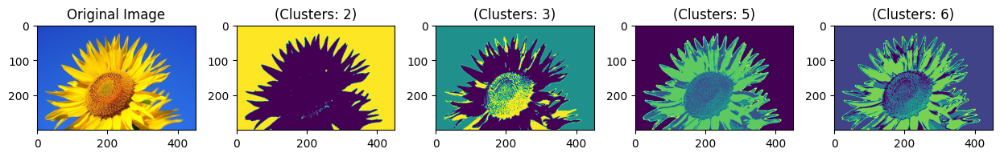

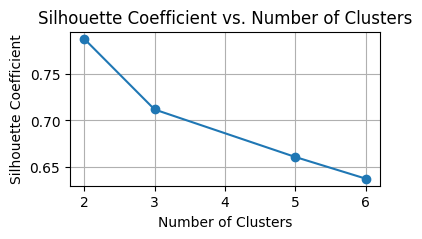

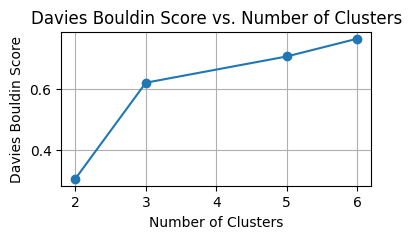

In [9]:
num_clusters_list = [2, 3, 5, 6]

silhouette_scores, davies_bouldin_scores = segment_image_knn_xy(images[1], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


For our final image, the augmentation still have no significant impact on the image.


Metrics for GMM: 2 Clusters:
 - Silhouette Coefficient: 0.6238470887765444
 - Davies bouldin score: 0.4514913830169653

Metrics for GMM: 3 Clusters:
 - Silhouette Coefficient: 0.47440210719421905
 - Davies bouldin score: 0.8306331200258882

Metrics for GMM: 5 Clusters:
 - Silhouette Coefficient: 0.19799197697707271
 - Davies bouldin score: 2.461398680166325

Metrics for GMM: 6 Clusters:
 - Silhouette Coefficient: 0.10067291177941136
 - Davies bouldin score: 2.4981872870823767


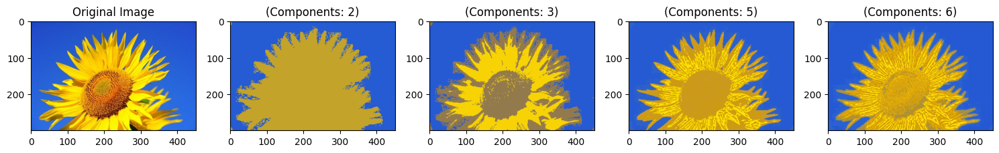

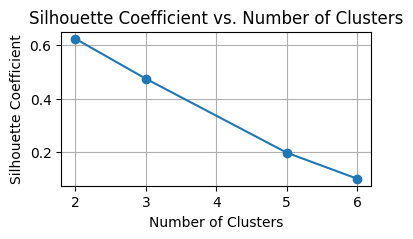

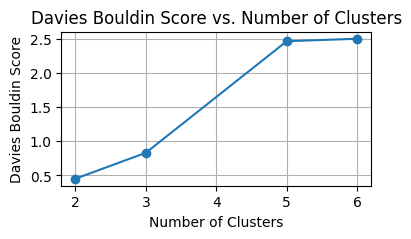

In [11]:
num_clusters_list = [2, 3, 5, 6]

silhouette_scores, davies_bouldin_scores = segment_image_gmm_xy(images[1], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


The augmentation here also has a mixed impact on clustering performance. While the Silhouette Coefficient for 2 clusters decreased with augmentation, other cluster numbers showed improvements. The Davies-Bouldin scores increased overall meaning worse compactness, the augmentation introduced complexities affecting GMM.


Metrics for DBSCAN: Min Samples 50:
 - Silhouette Coefficient: 0.11454178742964746
 - Davies bouldin score: 1.2823680017369

Metrics for DBSCAN: Min Samples 150:
 - Silhouette Coefficient: 0.5458577686456584
 - Davies bouldin score: 0.9101755401849845

Metrics for DBSCAN: Min Samples 200:
 - Silhouette Coefficient: 0.533151118358845
 - Davies bouldin score: 0.8725271738494529

Metrics for DBSCAN: Min Samples 300:
 - Silhouette Coefficient: 0.36580059310480345
 - Davies bouldin score: 0.9507912205400628


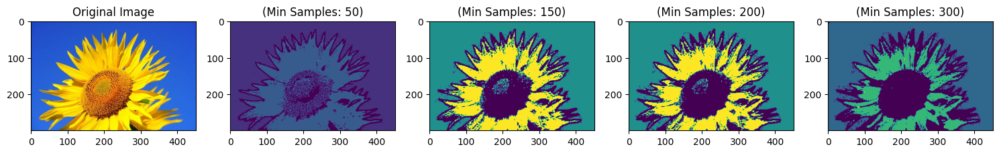

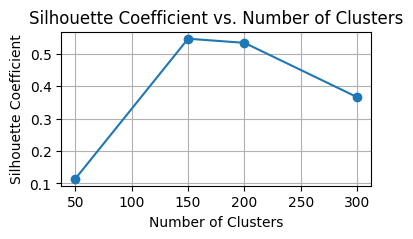

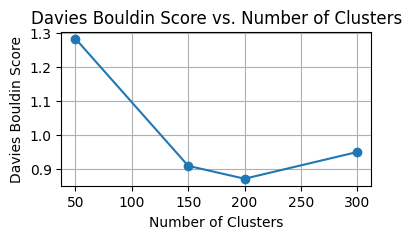

In [29]:
min_samples_list = [50, 150, 200, 300]
epsilon_value = 5

silhouette_scores_dbscan, davies_bouldin_scores_dbscan = segment_image_dbscan_xy(images[1], min_samples_list, epsilon_value)

plot_clusters_vs_metric(min_samples_list, silhouette_scores_dbscan, 'Silhouette Coefficient')
plot_clusters_vs_metric(min_samples_list, davies_bouldin_scores_dbscan, 'Davies Bouldin Score')

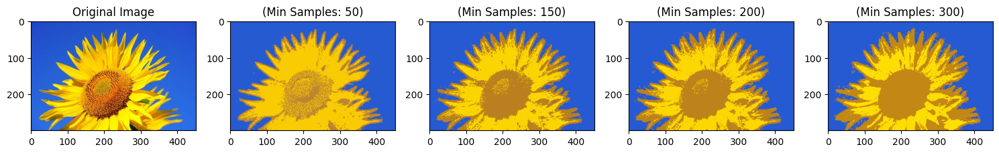

In [31]:
min_samples_list = [50, 150, 200, 300]
epsilon_value = 5

segment_image_dbscan_colors_xy(images[1], min_samples_list, epsilon_value)

For this image the results were mixed, sometimes better and other slightly worse than the original, but the highest score was for this one at 150 samples with x-y coordinates, further proving that DBSCAN gives better results using some extra features.

**Standardizing the features before
clustering.**

In [34]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn import metrics

def segment_image_knn_s(image, num_clusters_list, standardize=False):
    height, width, channels = image.shape

    image_2d = image.reshape((-1, 3))

    scaler = StandardScaler()
    image_2d = scaler.fit_transform(image_2d)

    plt.figure(figsize=(15, 5 * len(num_clusters_list)))

    plt.subplot(1, len(num_clusters_list) + 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    silhouette_scores = []
    davies_bouldin_scores = []

    for i, num_clusters in enumerate(num_clusters_list):
        model = KMeans(n_clusters=num_clusters, random_state=0, n_init=10)
        labels = model.fit_predict(image_2d)

        cluster_centers = scaler.inverse_transform(model.cluster_centers_).astype(np.uint8)
        segmented_colored_image = cluster_centers[labels].reshape((height, width, 3))

        plt.subplot(1, len(num_clusters_list) + 2, i + 2)
        plt.imshow(cv2.cvtColor(segmented_colored_image, cv2.COLOR_BGR2RGB))
        plt.title(f'(Clusters: {num_clusters})')

        silhouette_coefficient = metrics.silhouette_score(image_2d, labels)
        db_score = metrics.davies_bouldin_score(image_2d, labels)

        silhouette_scores.append(silhouette_coefficient)
        davies_bouldin_scores.append(db_score)

        print(f"\nMetrics for {num_clusters} Clusters:")
        print(f" - Silhouette Coefficient: {silhouette_coefficient}")
        print(f" - Davies bouldin score: {db_score}")

    plt.tight_layout()
    plt.show()

    return silhouette_scores, davies_bouldin_scores


Metrics for 2 Clusters:
 - Silhouette Coefficient: 0.6757824662857987
 - Davies bouldin score: 0.5607305660769993

Metrics for 3 Clusters:
 - Silhouette Coefficient: 0.7443387063411419
 - Davies bouldin score: 0.3485781735565157

Metrics for 4 Clusters:
 - Silhouette Coefficient: 0.6590477815150414
 - Davies bouldin score: 0.4699348300422903

Metrics for 5 Clusters:
 - Silhouette Coefficient: 0.6327201724868596
 - Davies bouldin score: 0.5890287011691517

Metrics for 7 Clusters:
 - Silhouette Coefficient: 0.5732480842178873
 - Davies bouldin score: 0.6637516316066723


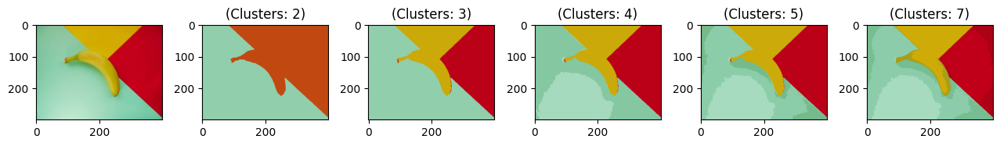

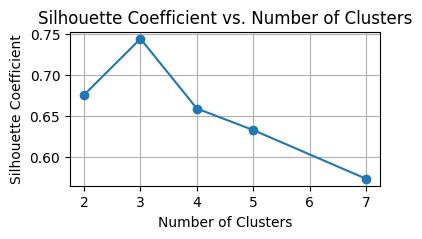

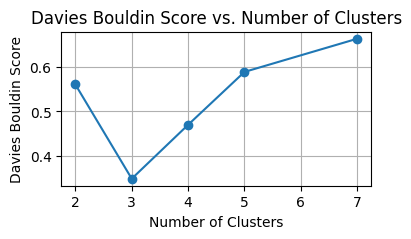

In [23]:
num_clusters_list = [2, 3, 4, 5, 7]

silhouette_scores, davies_bouldin_scores = segment_image_knn_s(images[3], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


The results without standardization are far better than with, this might be because its designed to scale features for models sensitive to magnitude differences but KNN relies on distance metrics, standardization may distort the original feature relationships. But observing the images, standardization is slightly better as there are less noise and outliers compared to the original.

In [38]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn import metrics
from sklearn.preprocessing import StandardScaler


def segment_image_gmm_s(image, num_components_list):
    height, width, channels = image.shape
    image_2d = image.reshape((height * width, channels))
    scaler = StandardScaler()
    image_2d = scaler.fit_transform(image_2d)

    silhouette_scores = []
    davies_bouldin_scores = []

    plt.figure(figsize=(15, 5 * len(num_components_list)))

    plt.subplot(1, len(num_components_list) + 1, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    for i, num_components in enumerate(num_components_list):
        model = GaussianMixture(n_components=num_components, random_state=0)
        labels = model.fit_predict(image_2d)
        #means = model.means_.astype(int)

        means = scaler.inverse_transform(model.means_).astype(np.uint8)

        segmented_image = means[labels].reshape((height, width, channels))

        plt.subplot(1, len(num_components_list) + 1, i + 2)
        plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
        plt.title(f'(Components: {num_components})')

        silhouette_coefficient = metrics.silhouette_score(image_2d, labels)
        db_score = metrics.davies_bouldin_score(image_2d, labels)

        silhouette_scores.append(silhouette_coefficient)
        davies_bouldin_scores.append(db_score)

        print(f"\nMetrics for GMM: {num_components} Clusters:")
        print(f" - Silhouette Coefficient: {silhouette_coefficient}")
        print(f" - Davies bouldin score: {db_score}")

    plt.tight_layout()
    plt.show()

    return silhouette_scores, davies_bouldin_scores


Metrics for GMM: 2 Clusters:
 - Silhouette Coefficient: 0.6650741307525672
 - Davies bouldin score: 0.5728676163592092

Metrics for GMM: 3 Clusters:
 - Silhouette Coefficient: 0.6507828174980003
 - Davies bouldin score: 0.6882151049319317

Metrics for GMM: 4 Clusters:
 - Silhouette Coefficient: 0.44777422813352796
 - Davies bouldin score: 0.7999198409068354

Metrics for GMM: 5 Clusters:
 - Silhouette Coefficient: 0.6103267604950402
 - Davies bouldin score: 0.9417911206412551

Metrics for GMM: 7 Clusters:
 - Silhouette Coefficient: 0.4006208041872086
 - Davies bouldin score: 1.0946418635237272


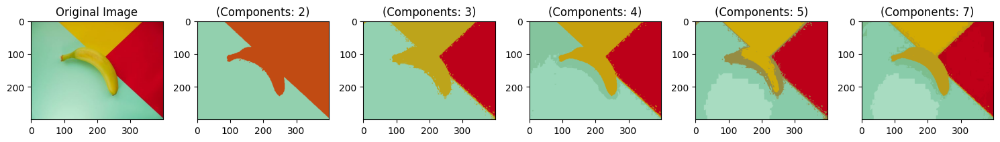

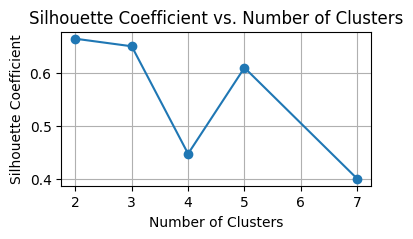

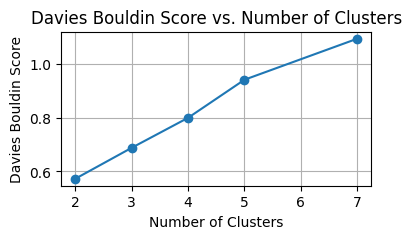

In [93]:
num_clusters_list = [2, 3, 4, 5, 7]

silhouette_scores, davies_bouldin_scores = segment_image_gmm_s(images[3], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


stanardization didnt do much here as well especially for low clusters, the images stayed exactly the same as before standardization, the bigger cluster images were slightly different but nothing noticable.

In [32]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

def segment_image_dbscan_s(image, min_samples_list, epsilon_value):
    height, width, channels = image.shape
    image_2d = image.reshape((height * width, channels))

    scaler = StandardScaler()
    image_2d_standardized = scaler.fit_transform(image_2d)

    silhouette_scores = []
    davies_bouldin_scores = []

    plt.figure(figsize=(15, 5 * len(min_samples_list)))

    plt.subplot(1, len(min_samples_list) + 1, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    for i, min_samples_value in enumerate(min_samples_list):
        model = DBSCAN(eps=epsilon_value, min_samples=min_samples_value)
        labels = model.fit_predict(image_2d_standardized)

        segmented_image = labels.reshape((height, width))

        colored_segmented_image = np.zeros_like(image, dtype=np.uint8)
        for label in np.unique(labels):
            mask = (segmented_image == label).reshape((height, width, 1))
            color = np.median(image[segmented_image == label], axis=0).astype(np.uint8)
            colored_segmented_image += (mask * color)

        plt.subplot(1, len(min_samples_list) + 1, i + 2)
        plt.imshow(cv2.cvtColor(colored_segmented_image, cv2.COLOR_BGR2RGB))
        plt.title(f'(Min Samples: {min_samples_value})')

        silhouette_coefficient = metrics.silhouette_score(image_2d_standardized, labels)
        db_score = metrics.davies_bouldin_score(image_2d_standardized, labels)

        silhouette_scores.append(silhouette_coefficient)
        davies_bouldin_scores.append(db_score)

        print(f"\nMetrics for DBSCAN: Min Samples {min_samples_value}:")
        print(f" - Silhouette Coefficient: {silhouette_coefficient}")
        print(f" - Davies bouldin score: {db_score}")

    plt.tight_layout()
    plt.show()

    return silhouette_scores, davies_bouldin_scores


For this part I had to resize all the images to 128x128 in order for this to run, memory issues kept rising when using the original image so I had to further resize it to save computational resources, the epsilon and samples list are different than before, this also goes for all the images as the same memory problem kept arising.


Metrics for DBSCAN: Min Samples 50:
 - Silhouette Coefficient: 0.38663310765118997
 - Davies bouldin score: 1.1760744551786624

Metrics for DBSCAN: Min Samples 150:
 - Silhouette Coefficient: 0.679786752160257
 - Davies bouldin score: 0.6544686320452126

Metrics for DBSCAN: Min Samples 200:
 - Silhouette Coefficient: 0.6847682391890446
 - Davies bouldin score: 0.6671913017183635

Metrics for DBSCAN: Min Samples 300:
 - Silhouette Coefficient: 0.692354966918101
 - Davies bouldin score: 0.7057010237340821

Metrics for DBSCAN: Min Samples 350:
 - Silhouette Coefficient: 0.6961360739464115
 - Davies bouldin score: 0.7214299670483588

Metrics for DBSCAN: Min Samples 400:
 - Silhouette Coefficient: 0.6979019703022818
 - Davies bouldin score: 0.7326069453033417

Metrics for DBSCAN: Min Samples 500:
 - Silhouette Coefficient: 0.6993411404928374
 - Davies bouldin score: 0.7512049522647068


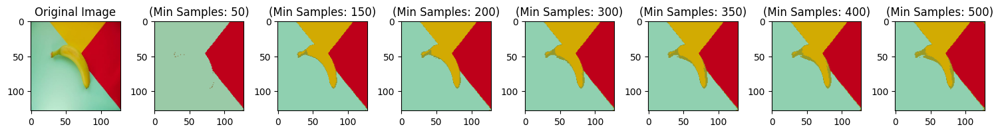

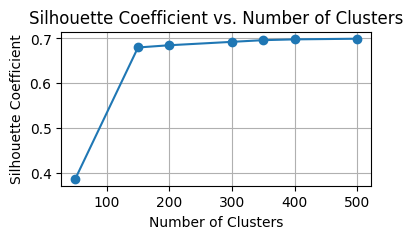

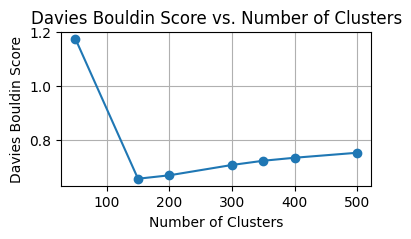

In [40]:
min_samples_list = [50, 150, 200, 300, 350, 400, 500]
resized_image = cv2.resize(images[3], (128, 128))

epsilon_value = 0.5

silhouette_scores_dbscan, davies_bouldin_scores_dbscan = segment_image_dbscan_s(resized_image, min_samples_list, epsilon_value)

plot_clusters_vs_metric(min_samples_list, silhouette_scores_dbscan, 'Silhouette Coefficient')
plot_clusters_vs_metric(min_samples_list, davies_bouldin_scores_dbscan, 'Davies Bouldin Score')

We can see the scores for most are acceptable, but observing the images, having 50 samples is not good compared to the other samples.

The second image now:


Metrics for 3 Clusters:
 - Silhouette Coefficient: 0.5272384973955235
 - Davies bouldin score: 0.7258950241997649

Metrics for 4 Clusters:
 - Silhouette Coefficient: 0.5872427260070877
 - Davies bouldin score: 0.5550904236359981

Metrics for 5 Clusters:
 - Silhouette Coefficient: 0.5806667834229899
 - Davies bouldin score: 0.5565982775293195

Metrics for 7 Clusters:
 - Silhouette Coefficient: 0.5533349963805962
 - Davies bouldin score: 0.6029269900964075


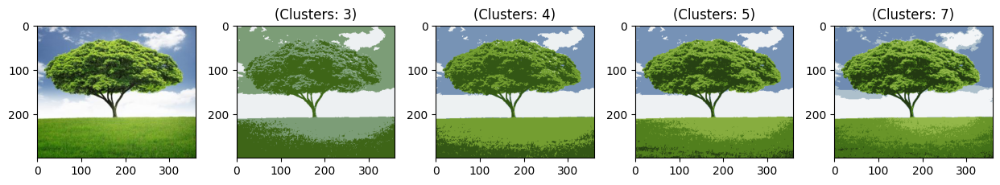

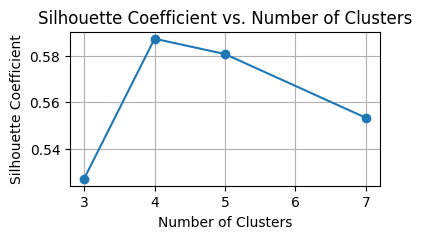

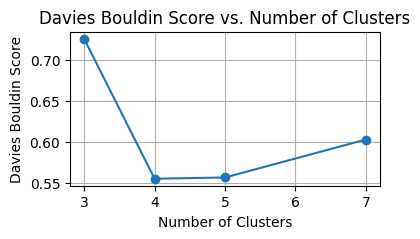

In [37]:
num_clusters_list = [3, 4, 5, 7]

silhouette_scores, davies_bouldin_scores = segment_image_knn_s(images[0], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


Same as the case above, the results are slightly worse, looking at the images with and without standardization, having 3 clusters is far worse with standardization, having 4 clusters produce the same image for both with a slight difference being that the green is more in the first image.


Metrics for GMM: 3 Clusters:
 - Silhouette Coefficient: 0.4574236237436962
 - Davies bouldin score: 0.7327673849094122

Metrics for GMM: 4 Clusters:
 - Silhouette Coefficient: 0.3709468803266044
 - Davies bouldin score: 0.8661680497946799

Metrics for GMM: 5 Clusters:
 - Silhouette Coefficient: 0.41100175888447027
 - Davies bouldin score: 1.10519502151466

Metrics for GMM: 7 Clusters:
 - Silhouette Coefficient: 0.27292281194957496
 - Davies bouldin score: 1.8149049537433624


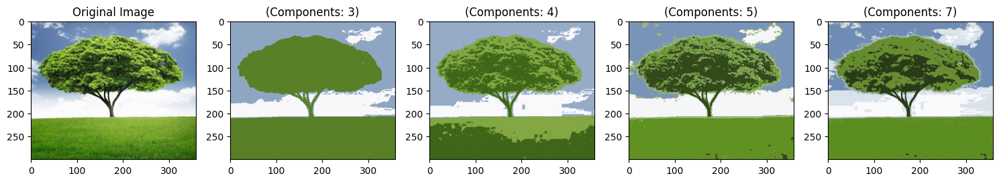

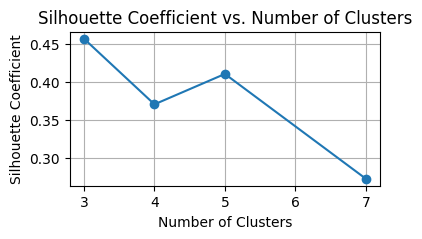

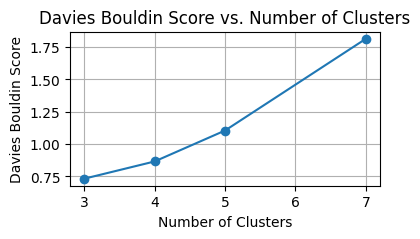

In [39]:
num_clusters_list = [3, 4, 5, 7]

silhouette_scores, davies_bouldin_scores = segment_image_gmm_s(images[0], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


Same case here too, the results are lower and the images are somewhat similar.


Metrics for DBSCAN: Min Samples 20:
 - Silhouette Coefficient: 0.2712159562868751
 - Davies bouldin score: 1.6308778670804733

Metrics for DBSCAN: Min Samples 30:
 - Silhouette Coefficient: 0.27852706270753347
 - Davies bouldin score: 1.5658682259211478

Metrics for DBSCAN: Min Samples 50:
 - Silhouette Coefficient: 0.26309262047144166
 - Davies bouldin score: 1.5589299571212611

Metrics for DBSCAN: Min Samples 100:
 - Silhouette Coefficient: 0.3814495795684856
 - Davies bouldin score: 1.7522751118080713

Metrics for DBSCAN: Min Samples 200:
 - Silhouette Coefficient: 0.30966645615820293
 - Davies bouldin score: 2.1164192437890845


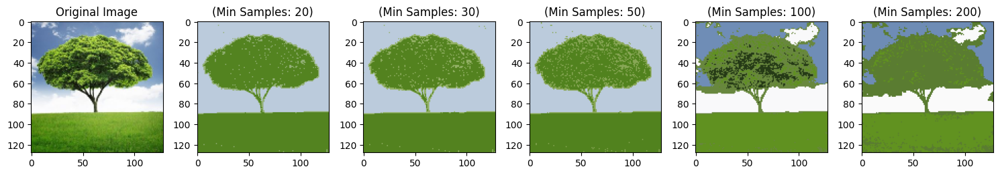

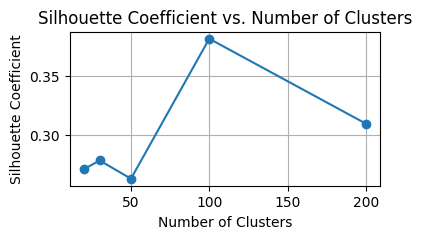

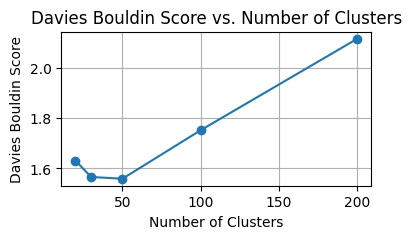

In [46]:
min_samples_list = [20, 30, 50, 100, 200]
resized_image = cv2.resize(images[0], (128, 128))

epsilon_value = 0.1

silhouette_scores_dbscan, davies_bouldin_scores_dbscan = segment_image_dbscan_s(resized_image, min_samples_list, epsilon_value)

plot_clusters_vs_metric(min_samples_list, silhouette_scores_dbscan, 'Silhouette Coefficient')
plot_clusters_vs_metric(min_samples_list, davies_bouldin_scores_dbscan, 'Davies Bouldin Score')

Here also I had to resize the image and change the epsilon, the produced results are decent, but with the change in image shape, it might lose some features.


Metrics for 3 Clusters:
 - Silhouette Coefficient: 0.6453236117767562
 - Davies bouldin score: 0.6623576612199248

Metrics for 5 Clusters:
 - Silhouette Coefficient: 0.4753626657805537
 - Davies bouldin score: 0.8293347436914809

Metrics for 6 Clusters:
 - Silhouette Coefficient: 0.47690431524736954
 - Davies bouldin score: 0.7879997640606473

Metrics for 8 Clusters:
 - Silhouette Coefficient: 0.43814317686665294
 - Davies bouldin score: 0.8041643354158143


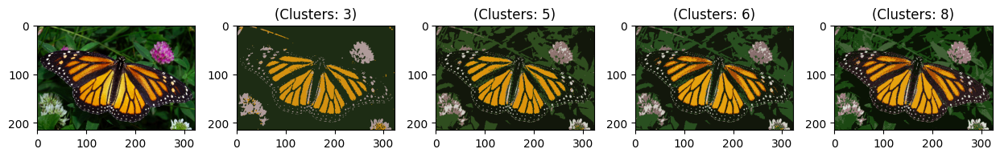

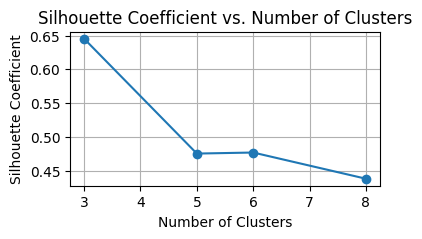

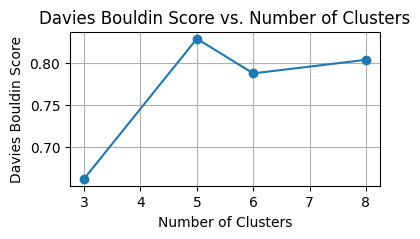

In [41]:
num_clusters_list = [3, 5, 6, 8]

silhouette_scores, davies_bouldin_scores = segment_image_knn_s(images[2], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


Similar to the two images above, the results are decent but not as good as without standardization.


Metrics for GMM: 3 Clusters:
 - Silhouette Coefficient: 0.5294599273365425
 - Davies bouldin score: 1.1850678707548234

Metrics for GMM: 5 Clusters:
 - Silhouette Coefficient: 0.22021960293164491
 - Davies bouldin score: 1.432112078237765

Metrics for GMM: 6 Clusters:
 - Silhouette Coefficient: 0.3117404236526017
 - Davies bouldin score: 1.2964861810479043

Metrics for GMM: 8 Clusters:
 - Silhouette Coefficient: 0.34674058242546807
 - Davies bouldin score: 1.1470028158081114


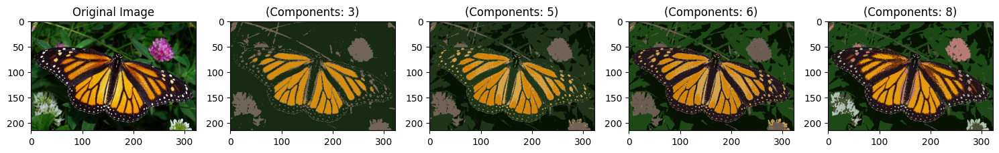

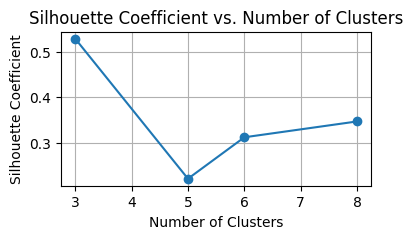

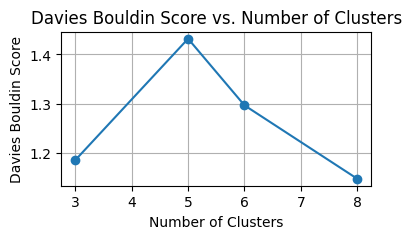

In [42]:
num_clusters_list = [3, 5, 6, 8]

silhouette_scores, davies_bouldin_scores = segment_image_gmm_s(images[2], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


Also here standardization has a minimal effect on gmm, this is because it assumes Gaussian distributions for each cluster, making it less sensitive to feature scales. GMM models the data's underlying probabilistic structure rather than relying on absolute feature values.


Metrics for DBSCAN: Min Samples 50:
 - Silhouette Coefficient: 0.45795880739941386
 - Davies bouldin score: 1.211348789578628

Metrics for DBSCAN: Min Samples 150:
 - Silhouette Coefficient: 0.5778104135874376
 - Davies bouldin score: 0.9542459970919932

Metrics for DBSCAN: Min Samples 300:
 - Silhouette Coefficient: 0.5341246984730064
 - Davies bouldin score: 0.9641054260601614

Metrics for DBSCAN: Min Samples 500:
 - Silhouette Coefficient: 0.48818880112550783
 - Davies bouldin score: 0.96658467389894


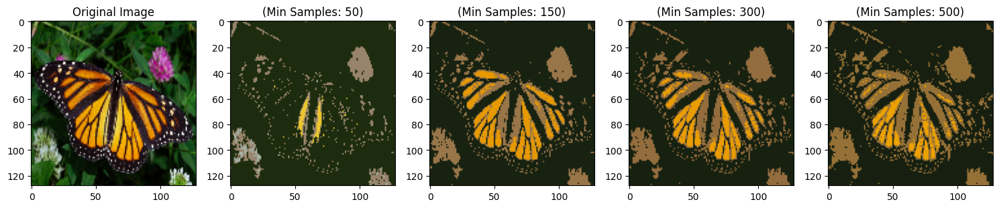

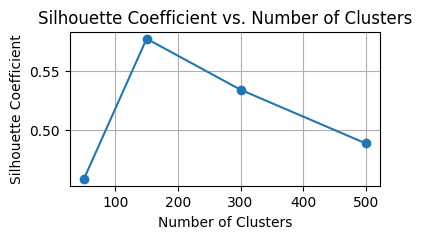

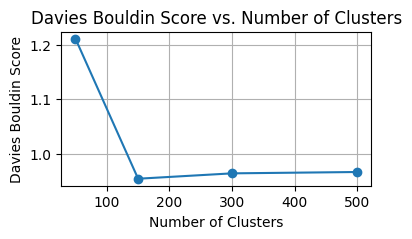

In [53]:
min_samples_list = [50, 150, 300, 500]
resized_image = cv2.resize(images[2], (128, 128))

epsilon_value = 0.3

silhouette_scores_dbscan, davies_bouldin_scores_dbscan = segment_image_dbscan_s(resized_image, min_samples_list, epsilon_value)

plot_clusters_vs_metric(min_samples_list, silhouette_scores_dbscan, 'Silhouette Coefficient')
plot_clusters_vs_metric(min_samples_list, davies_bouldin_scores_dbscan, 'Davies Bouldin Score')

Here I had to try with multiple samples, the scores are better than without standardization but this could also be because of the resizing done to the image beforehand which might led to it losing some features at the expanse of gaining some computational resources since this wouldn't run without the resizing.


Metrics for 2 Clusters:
 - Silhouette Coefficient: 0.7367971863302035
 - Davies bouldin score: 0.3887755863277891

Metrics for 3 Clusters:
 - Silhouette Coefficient: 0.7032282496154358
 - Davies bouldin score: 0.5928304692788792

Metrics for 5 Clusters:
 - Silhouette Coefficient: 0.6584501200548977
 - Davies bouldin score: 0.7353336469581784

Metrics for 6 Clusters:
 - Silhouette Coefficient: 0.6245268479626729
 - Davies bouldin score: 0.7138949044536705


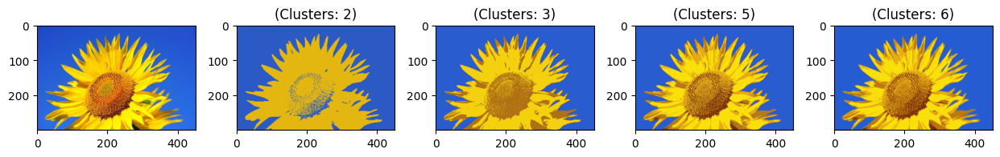

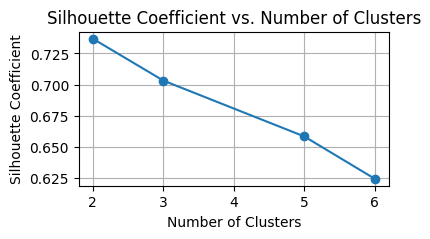

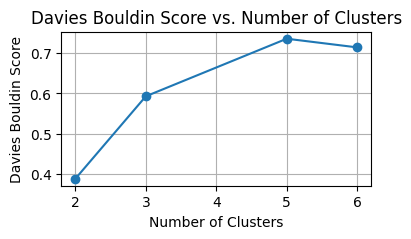

In [43]:
num_clusters_list = [2, 3, 5, 6]

silhouette_scores, davies_bouldin_scores = segment_image_knn_s(images[1], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores, 'Davies Bouldin Score')


For the last image we also see the same result structure, the results are not as good as the original, this is because standardization can affect KNN as it relies on distance metrics, making feature scales crucial.


Metrics for GMM: 2 Clusters:
 - Silhouette Coefficient: 0.6220060447985343
 - Davies bouldin score: 0.485459513156736

Metrics for GMM: 3 Clusters:
 - Silhouette Coefficient: 0.5148533103951484
 - Davies bouldin score: 0.8099363951032301

Metrics for GMM: 5 Clusters:
 - Silhouette Coefficient: 0.24216595337713792
 - Davies bouldin score: 2.918658640893539

Metrics for GMM: 6 Clusters:
 - Silhouette Coefficient: 0.1331769450764247
 - Davies bouldin score: 2.2796984395131306


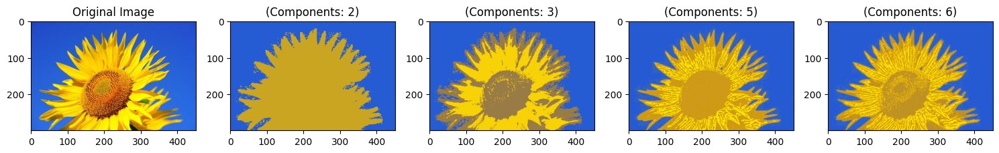

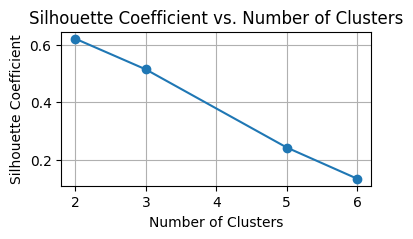

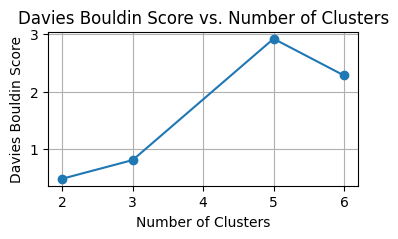

In [44]:
num_clusters_list = [2, 3, 5, 6]

silhouette_scores_gmm, davies_bouldin_scores_gmm = segment_image_gmm_s(images[1], num_clusters_list)

plot_clusters_vs_metric(num_clusters_list, silhouette_scores_gmm, 'Silhouette Coefficient')
plot_clusters_vs_metric(num_clusters_list, davies_bouldin_scores_gmm, 'Davies Bouldin Score')


Same for all cases, only minimal differences are noticed between original and standardization.


Metrics for DBSCAN: Min Samples 20:
 - Silhouette Coefficient: 0.49155473470330674
 - Davies bouldin score: 1.0362771168459424

Metrics for DBSCAN: Min Samples 30:
 - Silhouette Coefficient: 0.4719382068268106
 - Davies bouldin score: 1.2792415731637257

Metrics for DBSCAN: Min Samples 50:
 - Silhouette Coefficient: 0.5808361377900958
 - Davies bouldin score: 0.8482517862675357

Metrics for DBSCAN: Min Samples 150:
 - Silhouette Coefficient: 0.578293497333098
 - Davies bouldin score: 0.6724762824901013

Metrics for DBSCAN: Min Samples 300:
 - Silhouette Coefficient: 0.534986585090716
 - Davies bouldin score: 0.676575378000693

Metrics for DBSCAN: Min Samples 500:
 - Silhouette Coefficient: 0.6478559760091795
 - Davies bouldin score: 0.45697348129344173


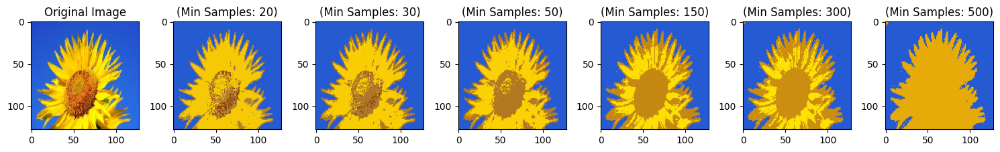

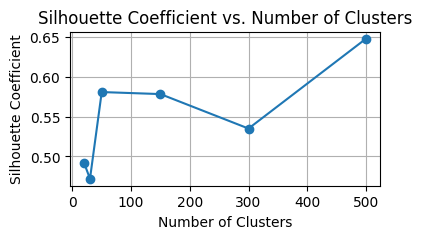

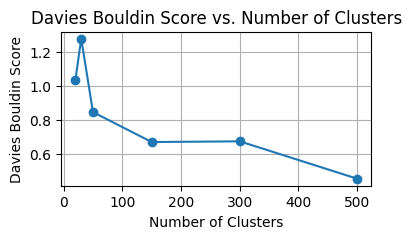

In [58]:
min_samples_list = [20, 30, 50, 150, 300, 500]
resized_image = cv2.resize(images[1], (128, 128))

epsilon_value = 0.1

silhouette_scores_dbscan, davies_bouldin_scores_dbscan = segment_image_dbscan_s(resized_image, min_samples_list, epsilon_value)

plot_clusters_vs_metric(min_samples_list, silhouette_scores_dbscan, 'Silhouette Coefficient')
plot_clusters_vs_metric(min_samples_list, davies_bouldin_scores_dbscan, 'Davies Bouldin Score')

For this last part epsilon of 0.1 was used as any higher ones would result in a crash or few label results, the output results are decent, dbscan is not that sensitive because it relies on distance metric.

**Conclusion**

This case study goal was explore and compare the effectiveness of the clustering algorithms K-means, Gaussian Mixture Model (GMM), and
DBSCAN - in the context of image segmentation on a set of diverse images.

Four images were chosen and tests were done on them using each one of the algoritms above, first tests were done in the RGB space, KNN proved superior over GMM in this case, but both of them had close values in most cases, while DBSCAN struggled with high dimensional spaces. But it gave decent results in the banana image.


As for augmenting the RGB channels with two additional
features that correspond to the x-y coordinates of the pixel the The results for DBSCAN using x-y coordinates are far better than without, this is becuase it benefits from the spatial information provided by XY coordinates as it leverages density-based clustering. The knn was not affected that much this is because it relies on distance metrics primarily driven by color information.

For the last part which is using standardization for the images, standardization can affect KNN as it relies on distance metrics, making feature scales crucial, standardization has a minimal effect on gmm, GMM models the data's underlying probabilistic structure rather than relying on absolute feature values.